# Projet 5 : Segmentez des clients d'un site e-commerce

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
from IPython.display import display
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import adjusted_rand_score, silhouette_score, davies_bouldin_score, calinski_harabasz_score
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer, InterclusterDistance
from kneed import KneeLocator
from scipy.cluster.hierarchy import dendrogram, linkage
import plotly.express as px
import warnings

# Table des matières

1. [Importation des données](#1)
2. [Segmentation RFM](#2)
    * [2.1 Construction du dataset](#3)
    * [2.2 K-means](#4)
       * [2.2.1 KElbowVisualizer](#5)
       * [2.2.2 Silhouette Visualizer](#6)
       * [2.2.3 Distance Intercluster](#7)
       * [2.2.4 Analyse métiers des clusters](#8)
3. [Segmentation RFM + Score](#9)
    * [3.1 KElbowVisualizer](#10)
    * [3.2 Silhouette Visualizer](#11)
    * [3.3 Distance Intercluster](#12)
    * [3.4 Analyse métiers des clusters](#13)  
4. [Segmentation RFM + Score + Payment Type](#14)
    * [4.1 KElbowVisualizer](#10)
    * [4.2 Silhouette Visualizer](#11)
    * [4.3 Distance Intercluster](#12)
    * [4.4 Analyse métiers des clusters](#13)  
3. [Modèle final](#14)

# 1. Importation des données 

In [2]:
data = pd.read_csv('data_customers.csv')

In [3]:
data.head()

,customer_unique_id,order_purchase_timestamp,order_delivered_customer_date,order_estimated_delivery_date,time_since_first_order,time_since_last_order,customer_city,customer_state,nb_total_order,nb_total_item,total_price,mean_price,payment_type,mean_review_score,seller_city,seller_state,cat
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,2018-05-16 20:48:37,2018-05-21,111,111,cajamar,SP,1,1,129.90,129.90,credit_card,5.0,piracicaba,SP,bed_bath_table
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,2018-05-10 18:02:42,2018-05-15,114,114,osasco,SP,1,1,18.90,18.90,credit_card,4.0,sao paulo,SP,health_beauty
2,0000f46a3911fa3c0805444483337064,2017-03-10 21:05:03,2017-04-05 14:38:47,2017-04-07,536,536,sao jose,SC,1,1,69.00,69.00,credit_card,3.0,campo limpo paulista,SP,stationery
3,0000f6ccb0745a6a4b88665a16c9f078,2017-10-12 20:29:41,2017-11-01 21:23:05,2017-11-13,320,320,belem,PA,1,1,25.99,25.99,credit_card,4.0,sao paulo,SP,telephony
4,0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,2017-11-27 23:08:56,2017-12-05,287,287,sorocaba,SP,1,1,180.00,180.00,credit_card,5.0,jacarei,SP,telephony


In [4]:
rfm = data[['customer_unique_id', 'time_since_last_order',
            'nb_total_order', 'total_price']].copy()

In [5]:
rfm = rfm.set_index('customer_unique_id')
rfm.columns = ['Recency', 'Frequency', 'Monetary']

In [6]:
rfm.head()

,Recency,Frequency,Monetary
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,1,129.90
0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,18.90
0000f46a3911fa3c0805444483337064,536,1,69.00
0000f6ccb0745a6a4b88665a16c9f078,320,1,25.99
0004aac84e0df4da2b147fca70cf8255,287,1,180.00


In [7]:
col_quanti = rfm.select_dtypes(['int64', 'float64']).columns
col_quali = rfm.select_dtypes(['category', 'object', 'bool']).columns

minmax_scale = MinMaxScaler()
ohe = OneHotEncoder()

preprocessor = ColumnTransformer(transformers=[
    ('quanti', minmax_scale, col_quanti),
    ('quali', ohe, col_quali)
])

In [8]:
rfm_scaled = pd.DataFrame(preprocessor.fit_transform(rfm),
                          index=rfm.index,
                          columns=rfm.columns)
rfm_scaled.head()

,Recency,Frequency,Monetary
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,0.159942,0.0,0.009603
0000b849f77a49e4a4ce2b2a4ca5be3f,0.164265,0.0,0.001343
0000f46a3911fa3c0805444483337064,0.772334,0.0,0.005071
0000f6ccb0745a6a4b88665a16c9f078,0.461095,0.0,0.001871
0004aac84e0df4da2b147fca70cf8255,0.413545,0.0,0.013330


## 2.2 K-means
K-Means est un algorithme d'apprentissage automatique non supervisé qui regroupe les données dans le nombre k de clusters spécifiés.

###  2.2.1 KElbowVisualizer

Le KElbowVisualizer de Yellowbrick permet d'appliquer la méthode du "coude" pour sélectionner le nombre optimal de clusters lors d'un clustering K-Means. Il ajuste le modèle pour différentes valeurs de K et aide à visualiser la performance selon plusieurs métriques.

Les principales métriques disponibles pour déterminer le K optimal sont :

- distorsion : somme des distances au carré entre chaque point et le centre de son cluster (inertie). Plus la distorsion est faible, plus les clusters sont compacts.
- silhouette : coefficient de silhouette moyen, qui mesure à la fois la cohésion intra-cluster et la séparation inter-cluster. Plus ce score est proche de 1, meilleure est la séparation.
- calinski_harabasz : rapport entre la dispersion inter-cluster et intra-cluster. Un score élevé indique des clusters bien séparés.
Par défaut, la métrique utilisée est la distorsion. Dans notre cas, nous commençons par analyser le résultat avec la métrique silhouette, qui correspond au silhouette score.

In [9]:
def elbow_visualizer(k_min, k_max, X, metric='silhouette', model=None, show_plot=True):
    """
    Affiche le KElbowVisualizer pour k allant de k_min à k_max selon la métrique indiquée.

    Returns
    -------
    visualizer : KElbowVisualizer
        L'objet visualizer ajusté.
    """
    
    if not (isinstance(k_min, int) and k_min >= 2):
        raise ValueError("k_min doit être un entier >= 2")
    if not (isinstance(k_max, int) and k_max >= k_min):
        raise ValueError("k_max doit être un entier >= k_min")

    if model is None:
        # Pour éviter le FutureWarning de scikit-learn
        model = KMeans(random_state=42, n_init=10)

    supported_metrics = ['distortion', 'silhouette', 'calinski_harabasz']
    if metric not in supported_metrics:
        raise ValueError(f"Métrique inconnue. Choisissez parmi : {supported_metrics}")

    visualizer = KElbowVisualizer(model, k=(k_min, k_max), metric=metric)

    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=FutureWarning)
        visualizer.fit(X)

    if show_plot:
        visualizer.show()

    return visualizer 

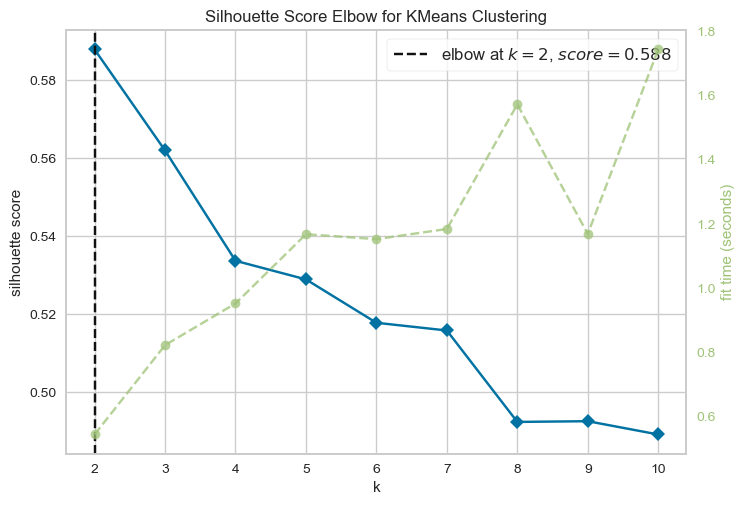

In [10]:
vis = elbow_visualizer(2, 11, rfm_scaled, metric='silhouette')

In [11]:
recap_kmeans_rfm = pd.DataFrame(data={'k': np.arange(2, 11),
                                      'sil_scores': vis.k_scores_,
                                      'temps': vis.k_timers_})

In [12]:
recap_kmeans_rfm

,k,sil_scores,temps
0,2,0.587920,0.543636
1,3,0.561978,0.821985
2,4,0.533653,0.951861
3,5,0.528871,1.167582
4,6,0.517735,1.152332
5,7,0.515753,1.183998
6,8,0.492276,1.572334
7,9,0.492459,1.168431
8,10,0.489051,1.743374


La méthode du coude basé sur le score de silhouette nous indique que la segmentation en 2 clusters (k=2) semble la plus optimale.

### 2.2.2 Silhouette Visualizer

Le Silhouette Visualizer de Yellowbrick permet d’évaluer la qualité d’un clustering en visualisant le coefficient de silhouette de chaque observation. Ce score mesure à la fois la cohésion au sein des clusters et la séparation entre eux. Plus le coefficient de silhouette est élevé (proche de 1), plus les clusters sont denses et bien séparés. Ce graphique aide ainsi à interpréter la pertinence du nombre de clusters choisi et à détecter d’éventuels points mal classés.

In [13]:
k_select = vis.elbow_value_

In [14]:
k_select

2

In [15]:
import warnings
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from yellowbrick.cluster import SilhouetteVisualizer

def silhouette_visualizer(k, X, model=None, show_plot=True):
    """
    Affiche le SilhouetteVisualizer pour un nombre de clusters donné.

    Parameters
    ----------
    k : int
        Le nombre de clusters à utiliser.
    X : array-like
        Les données à clusteriser.
    model : sklearn.cluster estimator, optional
        Le modèle de clustering à utiliser. Par défaut KMeans(n_clusters=k).
    show_plot : bool, optional
        Si True, affiche le graphique. Sinon, retourne l'objet visualiseur sans affichage.

    Returns
    -------
    visualizer : SilhouetteVisualizer
        L'objet visualiseur entraîné.
    """
    if not isinstance(k, int) or k < 2:
        raise ValueError("k doit être un entier supérieur ou égal à 2.")
    
    if model is None:
        model = KMeans(n_clusters=k, random_state=42, n_init=10)

    visualizer = SilhouetteVisualizer(model)

    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=FutureWarning)
        visualizer.fit(X)

    if show_plot:
        visualizer.show()

    return visualizer

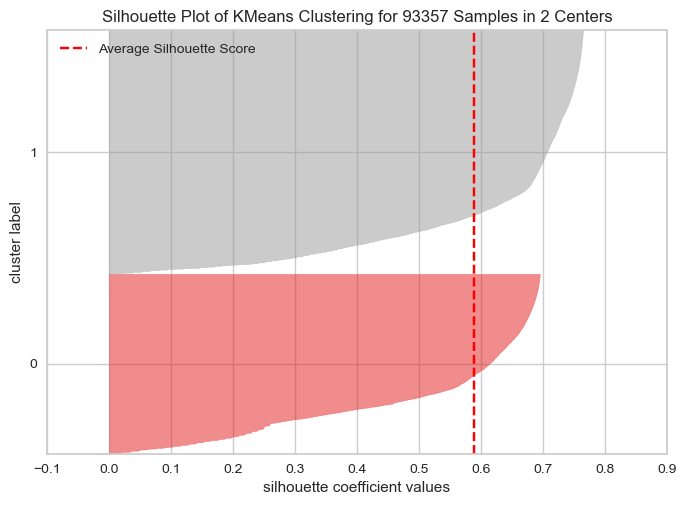

SilhouetteVisualizer(ax=<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 93357 Samples in 2 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     estimator=KMeans(n_clusters=2, n_init=10, random_state=42))

In [16]:
silhouette_visualizer(2, rfm_scaled)

On constate ici que les deux clusters sont assez larges, bien que le cluster 1 le soit plus. La largeur de chaque silhouette est proportionnelle au nombre d'échantillons affectés au cluster. Les silhouettes score sont positifs, ce qui signifie qu'aucune erreur n'a été effectuée. Le silhouette score moyen se situe près de 0.6.

Nous allons désormais effectuer la méthode du coude avec d'autres métriques.

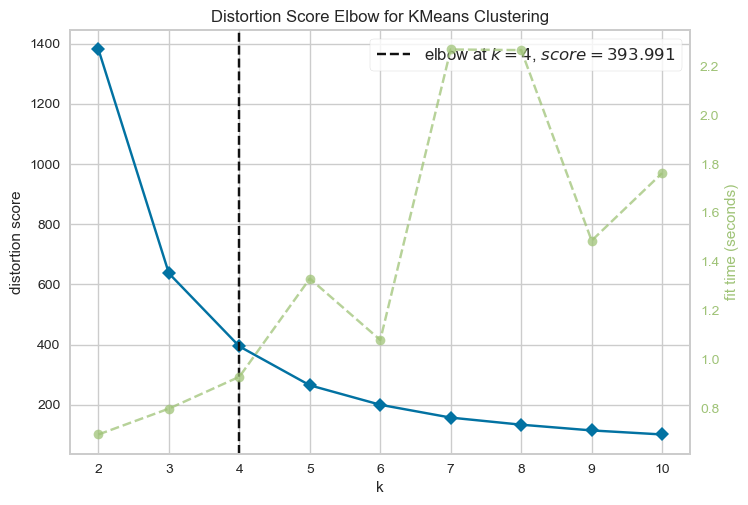

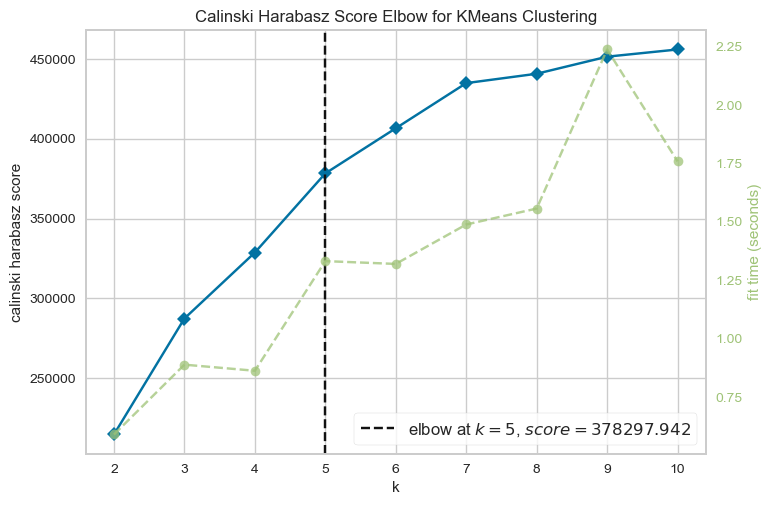

In [17]:
metrics = ["distortion", "calinski_harabasz"]

for m in metrics:
    elbow_visualizer(2, 11, rfm_scaled, m)

La méthode du coude avec le score de distortion nous indique un k optimal de 4. 
Avec la métrique 'calinski_harabasz', le choix se porte plutôt sur k = 5.

Nous allons désormais également étudier le graphique silhouette pour ces différents clustering (k égal 4 et 5).

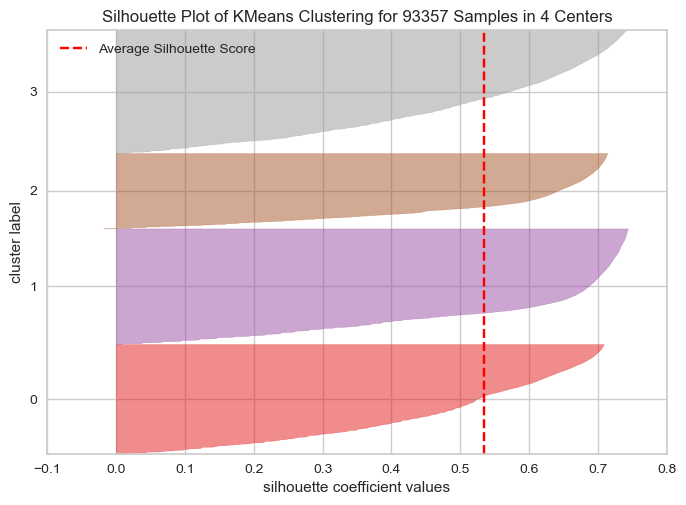

SilhouetteVisualizer(ax=<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 93357 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     estimator=KMeans(n_clusters=4, n_init=10, random_state=42))

In [18]:
silhouette_visualizer(4, rfm_scaled)

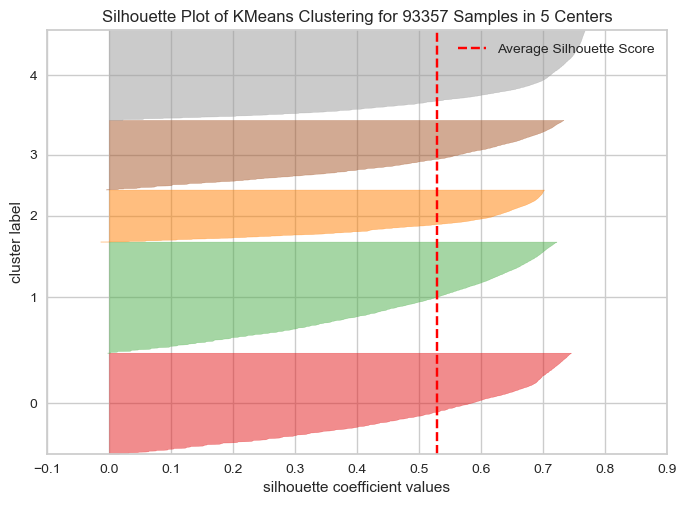

SilhouetteVisualizer(ax=<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 93357 Samples in 5 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     estimator=KMeans(n_clusters=5, n_init=10, random_state=42))

In [19]:
silhouette_visualizer(5, rfm_scaled)

Pour k = 4, on constate que la largeur des clusters est relativement similaire, bien que le cluster 2 soit un peu plus fin. Leur silhouette score moyen est au-dessus de 0.5. Le cluster 2 possède quelques observations qui semblent avoir un silhouette score négatif. Cela signifie que la moyenne des distances de l’observation aux observations du cluster le plus proche est inférieure à la moyenne des distances de l’observation aux observations de son cluster. Cela signifie que l’observation est possiblement mal classée.

Pour k = 5, on constate que la largeur des clusters est relativement similaire, bien que les clusters 2 et 3 soient un peu plus fin. Leur silhouette score moyen est au-dessus de 0.5 également. Le cluster 2 possède quelques observations qui semblent avoir un silhouette score négatif. Elles sont possiblement mal classées.

### 2.2.3 Distance intercluster

Le Distance Intercluster Visualizer de Yellowbrick permet de visualiser la séparation entre les différents clusters obtenus après un clustering. Cet outil projette les données sur les deux premières composantes principales (PCA) et affiche la distance entre les centres de chaque cluster. Cette visualisation aide à évaluer si les clusters sont bien distincts ou s’ils se chevauchent, ce qui est essentiel pour juger la qualité du partitionnement réalisé.

Nous allons désormais visualiser la distance entre nos clusters pour les différents clustering.

In [20]:
import warnings
from sklearn.cluster import KMeans
from yellowbrick.cluster import InterclusterDistance

def distance_visualizer(k, X, model=None, show_plot=True):
    """
    Affiche la visualisation des distances inter-clusters pour un clustering donné.

    Parameters
    ----------
    k : int
        Nombre de clusters à former.
    X : array-like
        Données d'entrée à clusteriser.
    model : sklearn.cluster estimator, optional
        Modèle de clustering à utiliser (par défaut : KMeans).
    show_plot : bool, optional
        Affiche ou non le graphique (par défaut : True).

    Returns
    -------
    visualizer : InterclusterDistance
        L'objet visualiseur entraîné.
    """
    if not isinstance(k, int) or k < 2:
        raise ValueError("k doit être un entier supérieur ou égal à 2.")

    if model is None:
        model = KMeans(n_clusters=k, random_state=42, n_init=10)

    visualizer = InterclusterDistance(model)

    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=FutureWarning)
        visualizer.fit(X)

    if show_plot:
        visualizer.show()

    return visualizer

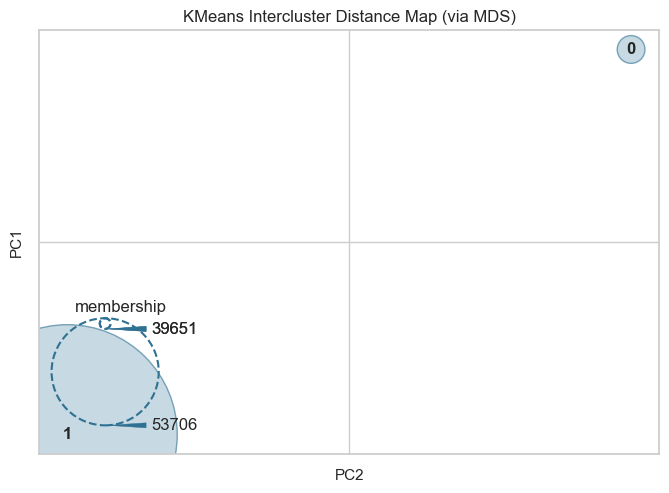

InterclusterDistance(ax=<Axes: title={'center': 'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>,
                     estimator=KMeans(n_clusters=2, n_init=10, random_state=42))

In [21]:
distance_visualizer(2, rfm_scaled)

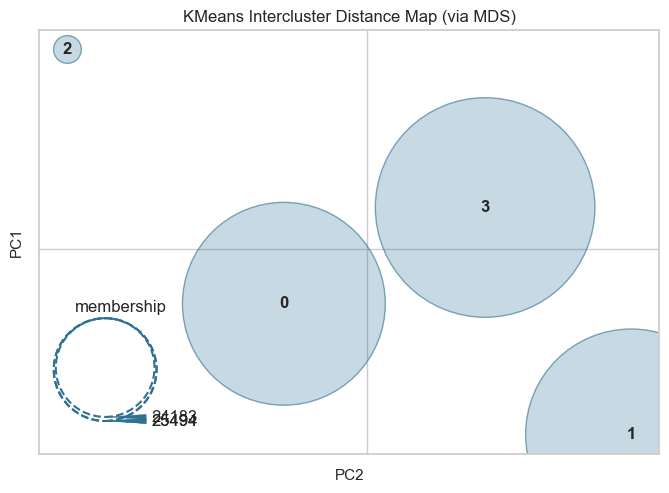

InterclusterDistance(ax=<Axes: title={'center': 'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>,
                     estimator=KMeans(n_clusters=4, n_init=10, random_state=42))

In [22]:
distance_visualizer(4, rfm_scaled)

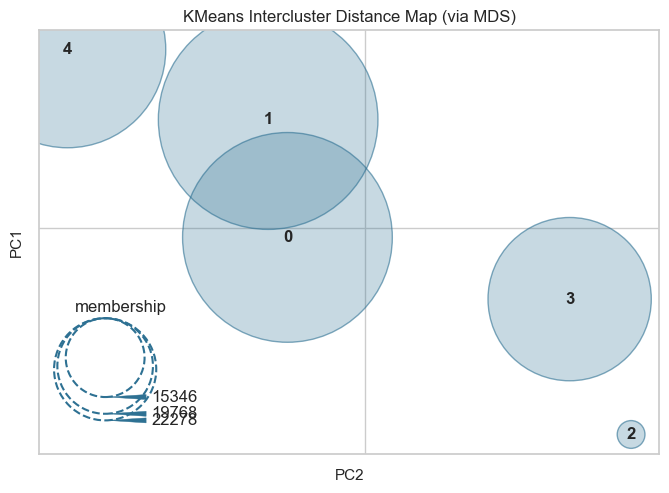

InterclusterDistance(ax=<Axes: title={'center': 'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>,
                     estimator=KMeans(n_clusters=5, n_init=10, random_state=42))

In [23]:
distance_visualizer(5, rfm_scaled)

### 2.2.4 Analyse métiers des différents clustering

Cette étape permet de donner du sens aux clusters en caractérisant les profils de clients associés à chaque groupe, d’identifier des opportunités d’action ciblée (marketing, fidélisation, etc.) et de valider la pertinence opérationnelle des segmentations obtenues.

Nous allons désormais identifier les caractéristiques métiers des clusters des différents clustering (k = 2, 4 et 5).

##### Modèle kmeans avec k = 2

In [24]:
mod_rfm_final = KMeans(n_clusters=k_select, random_state=42)
mod_rfm_final.fit(rfm_scaled)

/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=2, random_state=42)

In [25]:
rfm_lab = mod_rfm_final.predict(rfm_scaled)

In [26]:
rfm_kmeans_scaled = rfm_scaled.copy()
rfm_kmeans_scaled['cluster'] = rfm_lab

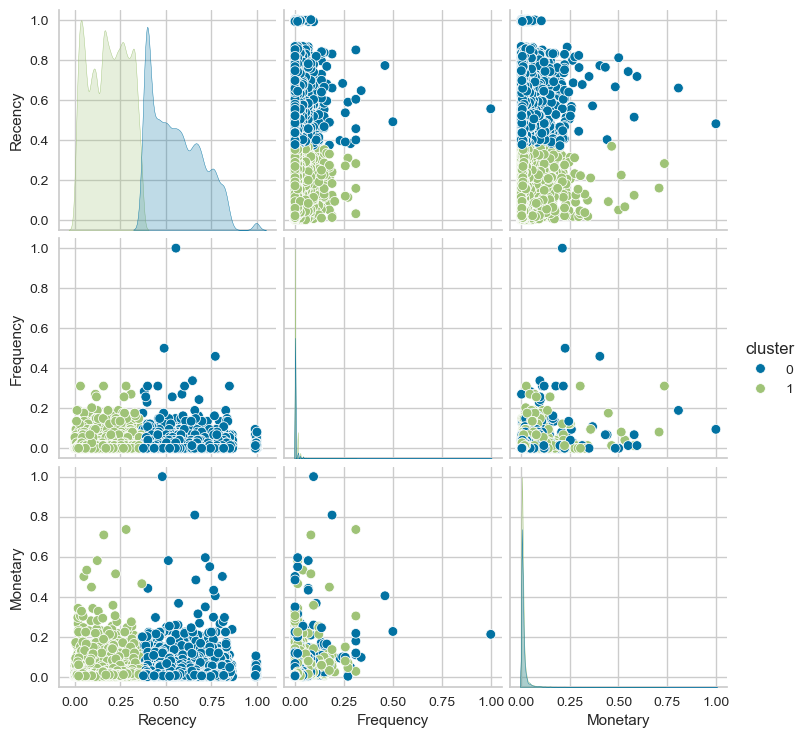

In [27]:
sns.pairplot(rfm_kmeans_scaled, hue="cluster")

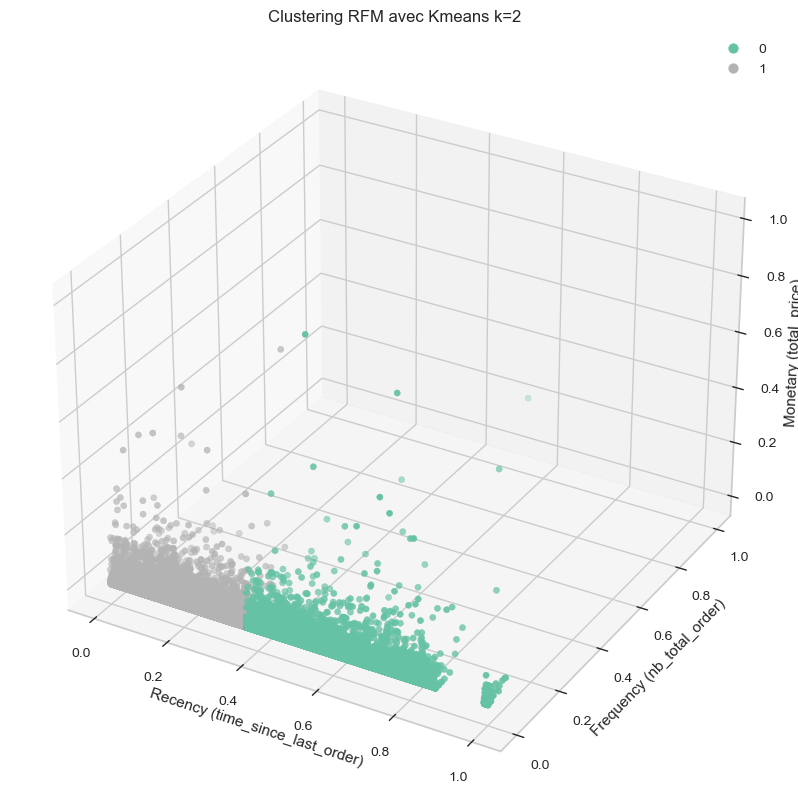

In [28]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(rfm_kmeans_scaled.iloc[:, 0],
                     rfm_kmeans_scaled.iloc[:, 1],
                     rfm_kmeans_scaled.iloc[:, 2],
                     c=rfm_kmeans_scaled['cluster'],
                     cmap=plt.cm.Set2)

ax.legend(*scatter.legend_elements())
ax.set_xlabel('Recency (time_since_last_order)')
ax.set_ylabel('Frequency (nb_total_order)')
ax.set_zlabel('Monetary (total_price)')
ax.set_title('Clustering RFM avec Kmeans k=2')

plt.show()

La représentation 3D nous permet de voir que le clustering effectué semble opposer les clients ayant commandé il y a longtemps et ceux ayant commandé plus récemment. Pour les 2 autres variables, la distinction est moindre. Nous allons vérifier cela avec un radar chart.

In [29]:
rfm_kmeans = rfm.copy()
rfm_kmeans['cluster'] = rfm_lab

In [30]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import plotly.express as px
import warnings

def radar_cluster(data, label, strat='mean'):
    """
    Affiche un radar chart pour chaque cluster du DataFrame.

    Parameters
    ----------
    data : pd.DataFrame
        Données contenant des variables numériques + la colonne de label.
    label : str
        Nom de la colonne contenant les labels de cluster.
    strat : str, optional
        Méthode d’agrégation : 'mean' (par défaut) ou 'median'.

    Returns
    -------
    None
    """
    if label not in data.columns:
        raise ValueError(f"La colonne '{label}' n'existe pas dans le DataFrame.")

    if strat not in ['mean', 'median']:
        raise ValueError("La stratégie d’agrégation doit être 'mean' ou 'median'.")

    # Agrégation
    grouped = data.groupby(label).agg(strat)

    # Normalisation
    scaler = MinMaxScaler()
    df_scaled = pd.DataFrame(scaler.fit_transform(grouped),
                             index=grouped.index,
                             columns=grouped.columns)

    # Affichage radar par cluster avec gestion du warning autour de px.line_polar
    for cluster_id, row in df_scaled.iterrows():
        with warnings.catch_warnings():
            warnings.simplefilter("ignore", category=FutureWarning)
            fig = px.line_polar(
                r=row.values,
                theta=row.index,
                line_close=True,
                title=f'Cluster {cluster_id}',
                range_r=[0, 1]
            )
        fig.update_traces(fill='toself')
        fig.show()

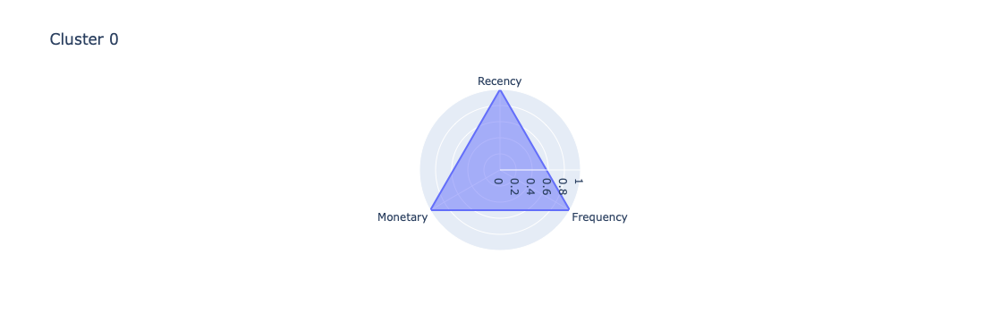

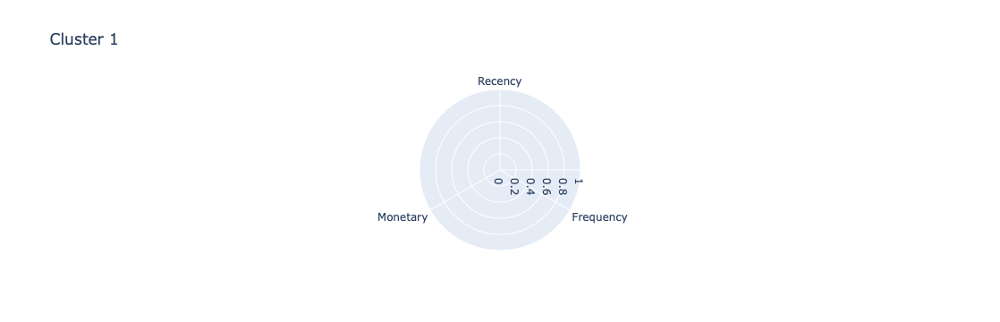

In [31]:
radar_cluster(rfm_kmeans, 'cluster', strat='mean')

In [32]:
print('Modèle kmeans k=2')
print('Silhouette Score : ', silhouette_score(rfm_scaled, rfm_lab))
print('Davies Bouldin Score : ', davies_bouldin_score(rfm_scaled, rfm_lab))
print('Calinski Harabasz Score :', calinski_harabasz_score(rfm_scaled,
                                                           rfm_lab))

Modèle kmeans k=2
Silhouette Score :  0.5879202509955386
Davies Bouldin Score :  0.5668248807203439
Calinski Harabasz Score : 214745.00172272848


##### Modèle kmeans avec k = 4

In [33]:
mod_rfm_final_4 = KMeans(n_clusters=4, random_state=42)
mod_rfm_final_4.fit(rfm_scaled)

/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



KMeans(n_clusters=4, random_state=42)

In [34]:
rfm_lab_4 = mod_rfm_final_4.predict(rfm_scaled)

In [35]:
rfm_kmeans_scaled_4 = rfm_scaled.copy()
rfm_kmeans_scaled_4['cluster'] = rfm_lab_4

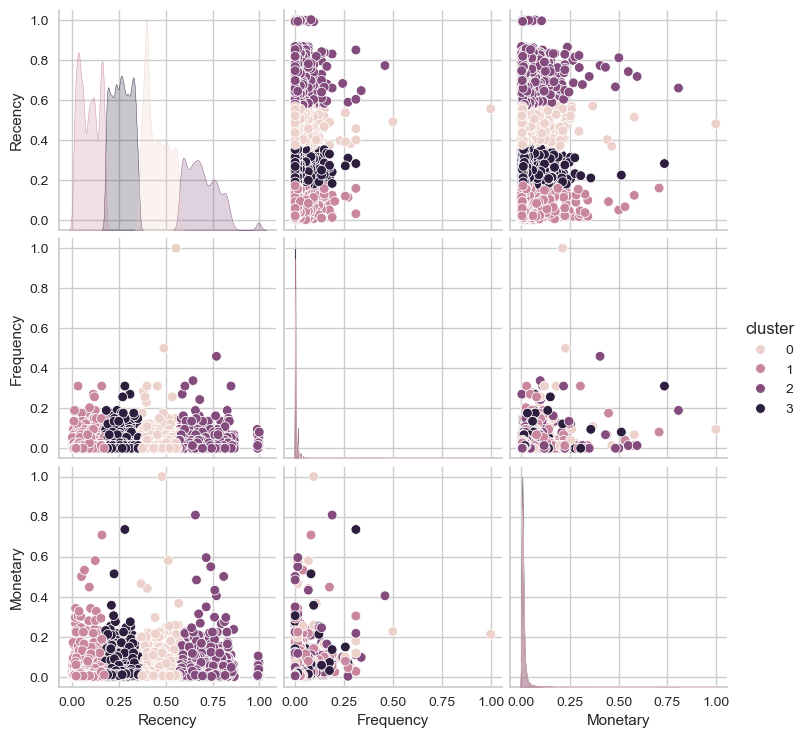

In [36]:
sns.pairplot(rfm_kmeans_scaled_4, hue="cluster")

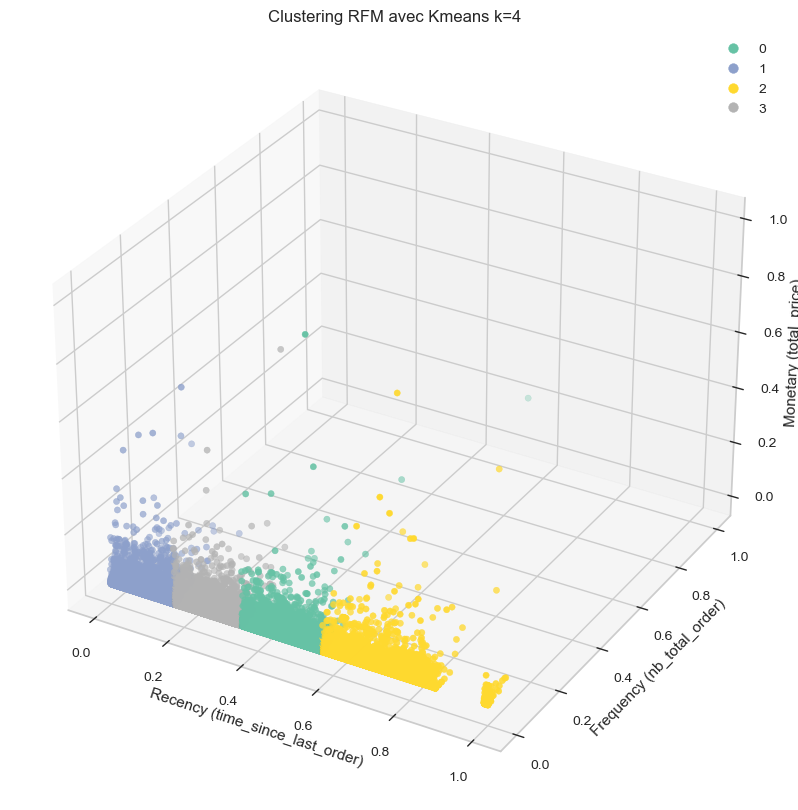

In [37]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(rfm_kmeans_scaled_4.iloc[:, 0],
                     rfm_kmeans_scaled_4.iloc[:, 1],
                     rfm_kmeans_scaled_4.iloc[:, 2],
                     c=rfm_lab_4, cmap=plt.cm.Set2)

ax.legend(*scatter.legend_elements())
ax.set_xlabel('Recency (time_since_last_order)')
ax.set_ylabel('Frequency (nb_total_order)')
ax.set_zlabel('Monetary (total_price)')
ax.set_title('Clustering RFM avec Kmeans k=4')

plt.show()

La représentation 3D nous permet de voir que la séparation des clusters se fait en grande partie au niveau de l'axe de la recense.

In [38]:
rfm_kmeans_4 = rfm.copy()
rfm_kmeans_4['cluster'] = rfm_lab_4

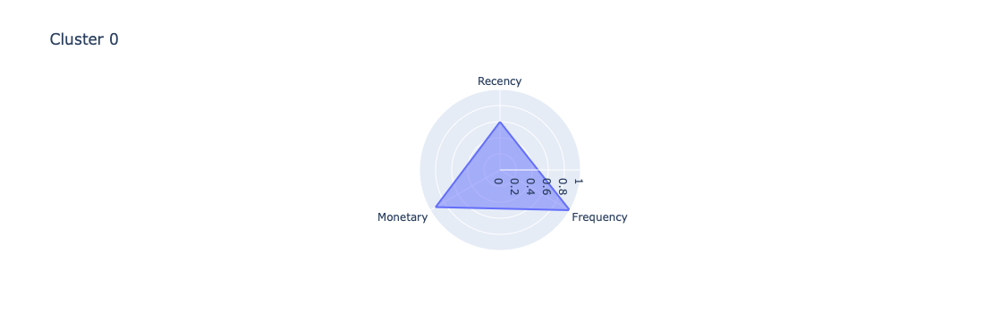

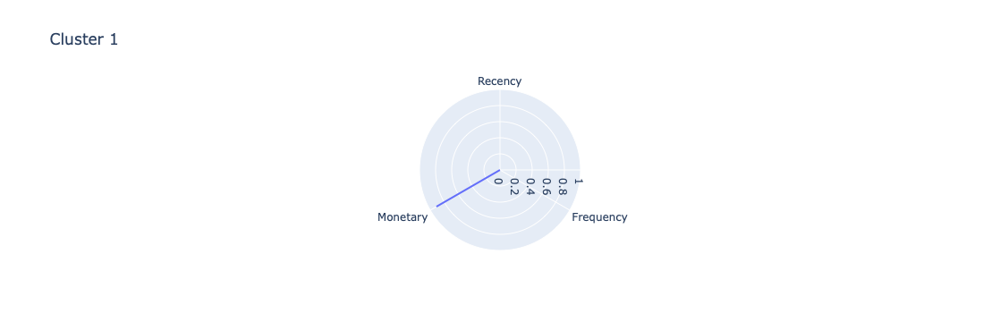

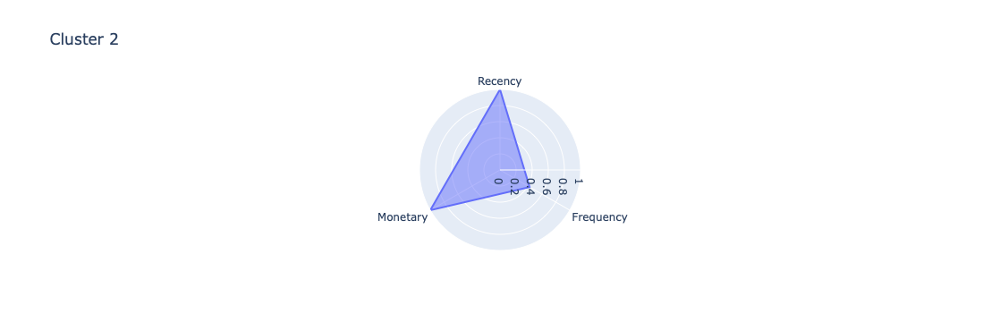

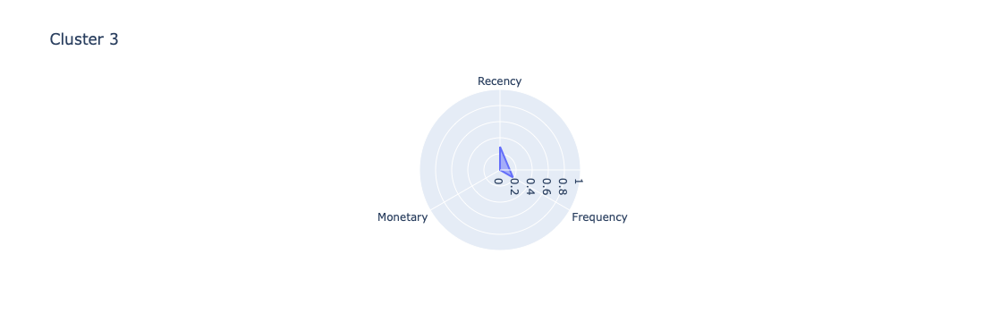

In [39]:
radar_cluster(rfm_kmeans_4, 'cluster', strat='mean')

In [40]:
print('Modèle kmeans k=4')
print('Silhouette Score : ', silhouette_score(rfm_scaled, rfm_lab_4))
print('Davies Bouldin Score : ', davies_bouldin_score(rfm_scaled, rfm_lab_4))
print('Calinski Harabasz Score :', calinski_harabasz_score(rfm_scaled,
                                                           rfm_lab_4))

Modèle kmeans k=4
Silhouette Score :  0.5336532966419448
Davies Bouldin Score :  0.5502103932434417
Calinski Harabasz Score : 328732.63378289214


##### Modèle kmeans avec k = 5

In [41]:
mod_rfm_final_5 = KMeans(n_clusters=5, random_state=0)
mod_rfm_final_5.fit(rfm_scaled)

/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



KMeans(n_clusters=5, random_state=0)

In [42]:
rfm_lab_5 = mod_rfm_final_5.predict(rfm_scaled)

In [43]:
rfm_kmeans_scaled_5 = rfm_scaled.copy()
rfm_kmeans_scaled_5['cluster'] = rfm_lab_5

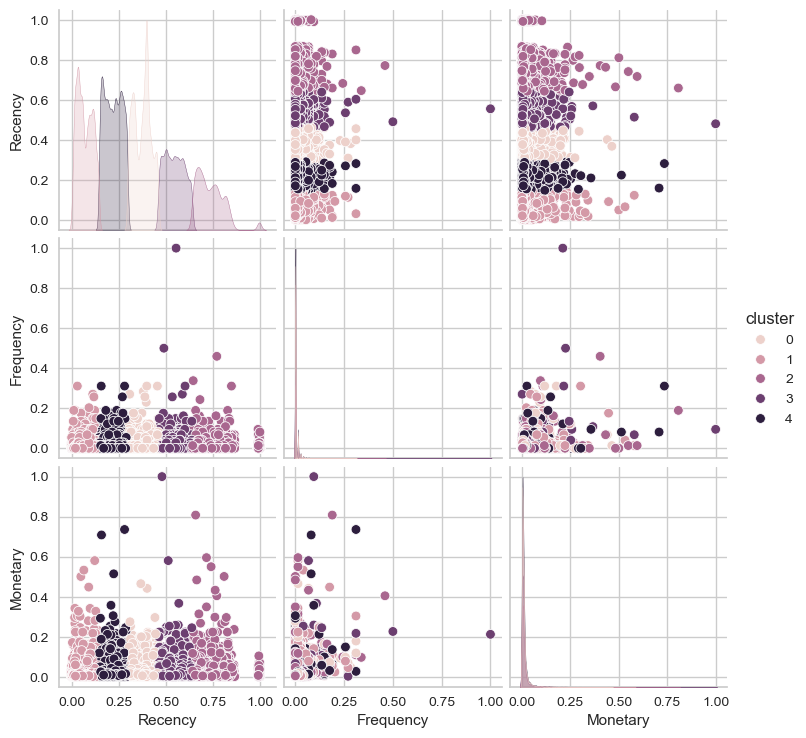

In [44]:
sns.pairplot(rfm_kmeans_scaled_5, hue="cluster")

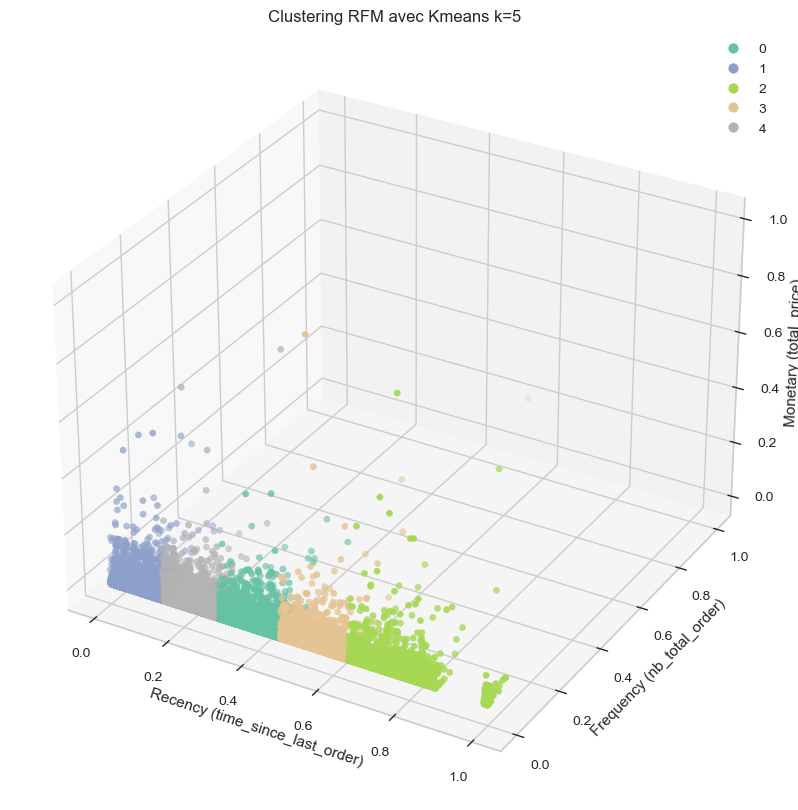

In [45]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(rfm_kmeans_scaled_5.iloc[:, 0],
                     rfm_kmeans_scaled_5.iloc[:, 1],
                     rfm_kmeans_scaled_5.iloc[:, 2],
                     c=rfm_lab_5, cmap=plt.cm.Set2)

ax.legend(*scatter.legend_elements())
ax.set_xlabel('Recency (time_since_last_order)')
ax.set_ylabel('Frequency (nb_total_order)')
ax.set_zlabel('Monetary (total_price)')
ax.set_title('Clustering RFM avec Kmeans k=5')

plt.show()

In [46]:
rfm_kmeans_5 = rfm.copy()
rfm_kmeans_5['cluster'] = rfm_lab_5

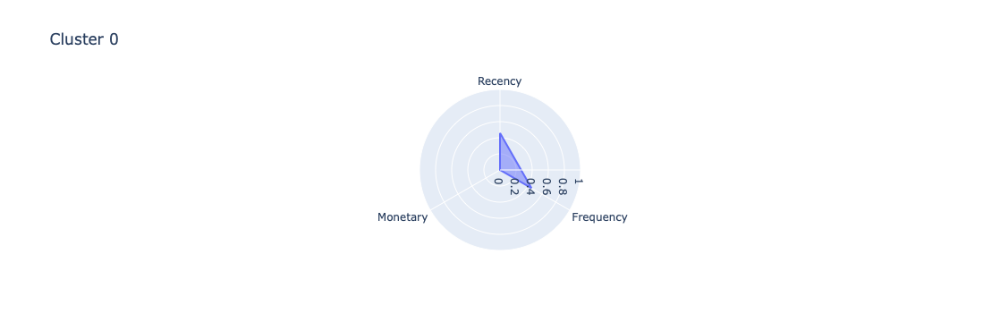

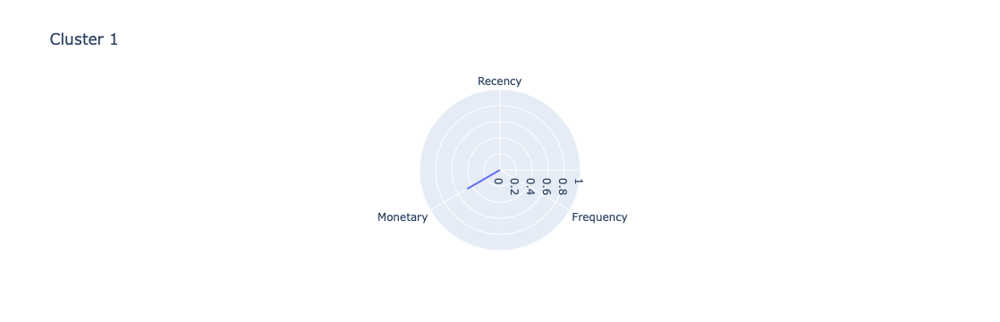

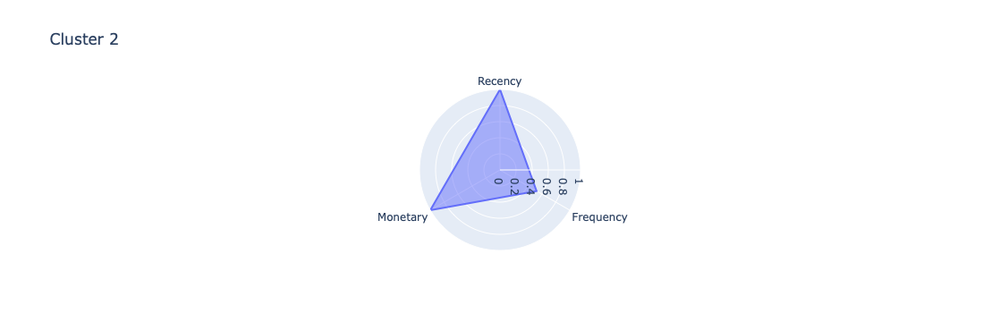

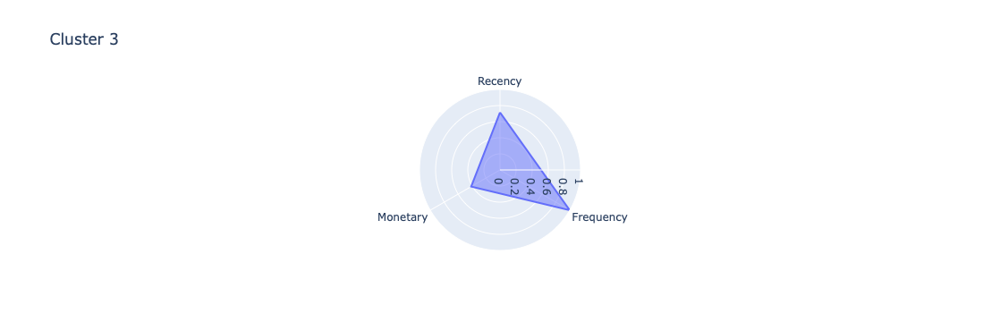

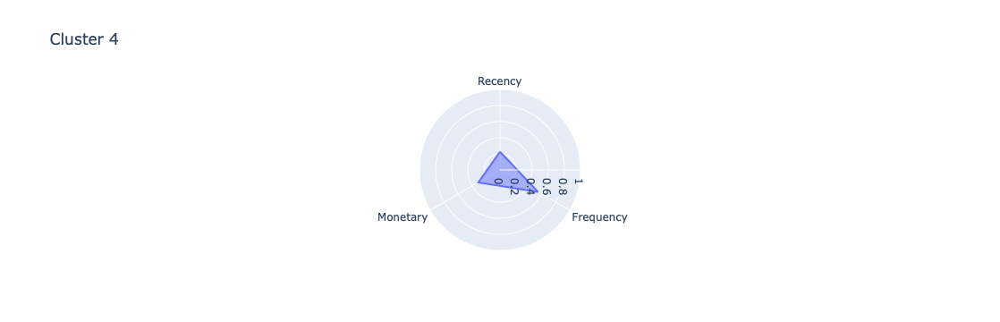

In [47]:
radar_cluster(rfm_kmeans_5, 'cluster', strat='mean')

In [48]:
print('Modèle kmeans k=5')
print('Silhouette Score : ', silhouette_score(rfm_scaled, rfm_lab_5))
print('Davies Bouldin Score : ', davies_bouldin_score(rfm_scaled, rfm_lab_5))
print('Calinski Harabasz Score :', calinski_harabasz_score(rfm_scaled,
                                                           rfm_lab_5))

Modèle kmeans k=5
Silhouette Score :  0.5285496943415656
Davies Bouldin Score :  0.5524914216130334
Calinski Harabasz Score : 378307.4899309915


De manière générale, les différents clustering réalisés par le kmeans sur le dataframe RFM (k = 2, 4 et 5) obtiennent de bons scores de silhouette, Davies Bouldin et Calinski Harabasz.

Nous allons désormais appliquer un nouveau modèle à la segmentation RFM: le DBSCAN.

## 2.3 DBSCAN

DBSCAN (Density-Based Spatial Clustering of Applications with Noise) est un algorithme de clustering non supervisé basé sur la densité. Contrairement à K-Means, il ne nécessite pas de spécifier le nombre de clusters à l’avance et permet d’identifier des groupes de forme arbitraire ainsi que des points considérés comme du bruit. DBSCAN fonctionne en regroupant les points proches les uns des autres selon une distance maximale (epsilon) et un nombre minimal de voisins. Cet algorithme est particulièrement utile pour détecter des structures complexes dans les données et gérer la présence d’outliers.

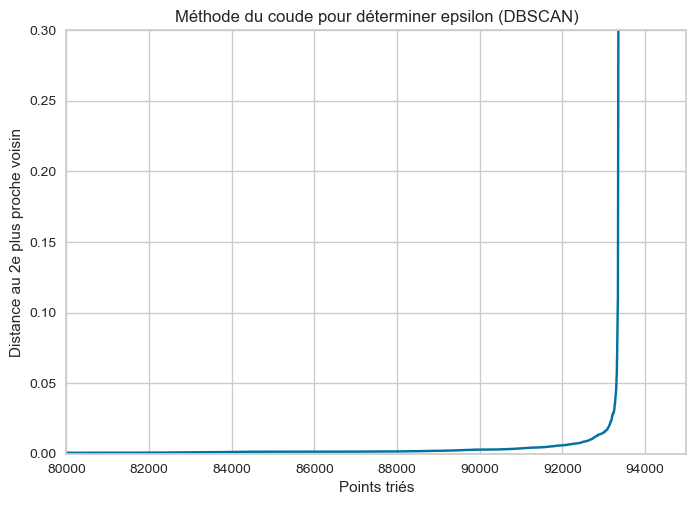

In [49]:
# Initialisation de l'algorithme des plus proches voisins avec 2 voisins (le point lui-même + son plus proche voisin)
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(rfm_scaled)

# Calcul des distances aux 2 plus proches voisins pour chaque point
distances, indices = nbrs.kneighbors(rfm_scaled)

# Tri des distances pour chaque point
distances = np.sort(distances, axis=0)

# On prend la distance vers le 2ème plus proche voisin (indice 1), utile pour la méthode du coude avec DBSCAN
dist = distances[:, 1]

# Affichage de la courbe des distances triées pour identifier un seuil epsilon
plt.xlim(80000, 95000)
plt.ylim(0, 0.3)
plt.plot(dist)
plt.title("Méthode du coude pour déterminer epsilon (DBSCAN)")
plt.xlabel("Points triés")
plt.ylabel("Distance au 2e plus proche voisin")
plt.grid(True)
plt.show()

In [50]:
# Détection automatique du "coude" sur la courbe des distances triées
# x : les indices des points (de 1 à n)
# y : les distances au 2ème plus proche voisin
# S : sensibilité (plus S est grand, plus le coude détecté est "souple")
# curve="convex" et direction="increasing" : pour correspondre à la forme attendue de la courbe
kneedle = KneeLocator(
    x=range(1, len(dist)+1), 
    y=dist,
    S=10,
    curve="convex",
    direction="increasing",
    online=True
)

# Affichage de la valeur de la distance au niveau du coude
# C'est une bonne estimation de l'hyperparamètre epsilon pour DBSCAN
print("Distance au coude (epsilon recommandé pour DBSCAN) :", kneedle.knee_y)

Distance au coude (epsilon recommandé pour DBSCAN) : 0.0008348742293969487


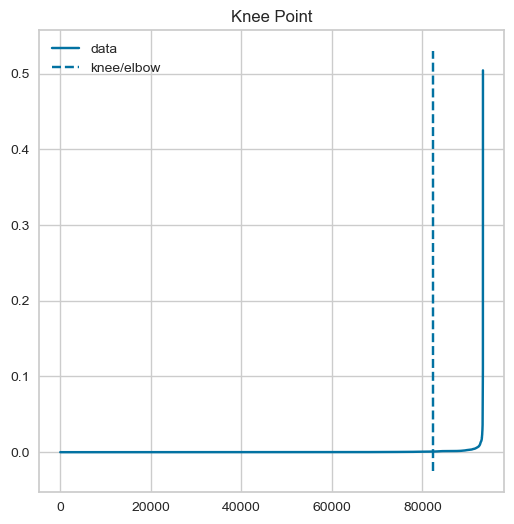

In [51]:
kneedle.plot_knee()  # Affiche la courbe analysée + le point du coude détecté
plt.show()           # Affiche la figure matplotlib

In [52]:
# Création du modèle DBSCAN avec les paramètres :
# eps : distance maximale pour qu’un point soit considéré comme voisin
# min_samples : nombre minimum de voisins pour qu’un point soit noyau (core point)
db_rfm = DBSCAN(eps=0.0008, min_samples=6)

# Entraînement du modèle DBSCAN sur les données normalisées rfm_scaled
db_rfm.fit(rfm_scaled)

DBSCAN(eps=0.0008, min_samples=6)

In [53]:
db_lab = db_rfm.labels_

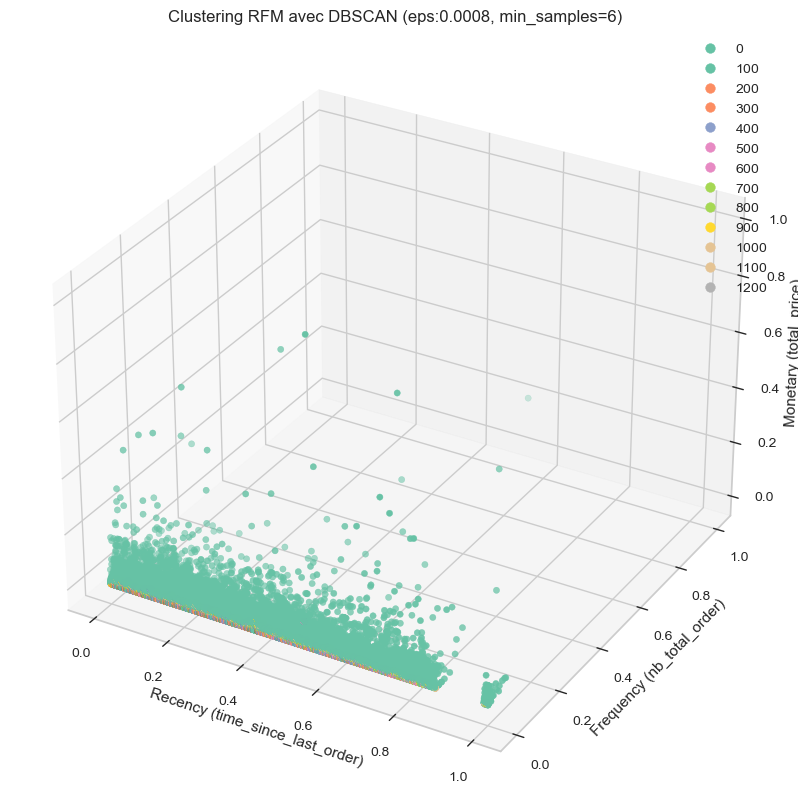

In [54]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(rfm_scaled.iloc[:, 0],
                     rfm_scaled.iloc[:, 1],
                     rfm_scaled.iloc[:, 2],
                     c=db_lab, cmap=plt.cm.Set2)

ax.legend(*scatter.legend_elements())
ax.set_xlabel('Recency (time_since_last_order)')
ax.set_ylabel('Frequency (nb_total_order)')
ax.set_zlabel('Monetary (total_price)')
ax.set_title('Clustering RFM avec DBSCAN (eps:0.0008, min_samples=6)')

plt.show()

In [55]:
print('Nombre de clusters avec le modèle DBSCAN: ',
      len(set(db_lab)) - (1 if -1 in db_lab else 0))
print('Nombre de points considérés comme du bruit: ', list(db_lab).count(-1))
print('Silhouette Score : ', silhouette_score(rfm_scaled, db_lab))
print('Davies Bouldin Score : ', davies_bouldin_score(rfm_scaled, db_lab))
print('Calinski Harabasz Score : ', calinski_harabasz_score(rfm_scaled,
                                                            db_lab))

Nombre de clusters avec le modèle DBSCAN:  1292
Nombre de points considérés comme du bruit:  24679
Silhouette Score :  -0.22086824204229874
Davies Bouldin Score :  2.7594307385530663
Calinski Harabasz Score :  155.78560631040565


In [56]:
# Essayons plusieurs valeurs différentes pour le paramètre epsilon (eps) de DBSCAN
for e in [0.03, 0.05, 0.1]:
    # Création du modèle DBSCAN avec l'epsilon courant et min_samples fixé à 6
    # n_jobs=-1 permet d'utiliser tous les cœurs CPU pour accélérer le calcul
    db_rfm_es = DBSCAN(eps=e, min_samples=6, n_jobs=-1)
    
    # Entraînement du modèle DBSCAN sur les données normalisées rfm_scaled
    db_rfm_es.fit(rfm_scaled)
    
    # Récupération des labels attribués à chaque point (cluster ou -1 pour bruit)
    db_lab_es = db_rfm_es.labels_

    # Affichage des paramètres du modèle testés
    print('Paramètres du modèle : epsilon : {}, min_samples : 6'.format(e))
    
    # Calcul et affichage du nombre de clusters détectés (exclut le bruit -1)
    print('Nombre de clusters avec le modèle DBSCAN : ',
          len(set(db_lab_es)) - (1 if -1 in db_lab_es else 0))
    
    # Calcul et affichage du nombre de points considérés comme bruit (-1)
    print('Nombre de points considérés comme du bruit: ',
          list(db_lab_es).count(-1))
    
    # Calcul et affichage de plusieurs métriques d’évaluation du clustering
    # Silhouette Score : mesure la cohésion et la séparation des clusters (plus haut = mieux)
    print('Silhouette Score : ', silhouette_score(rfm_scaled, db_lab_es))
    
    # Davies Bouldin Score : mesure la compacité et la séparation des clusters (plus bas = mieux)
    print('Davies Bouldin Score : ', davies_bouldin_score(rfm_scaled, db_lab_es))
    
    # Calinski Harabasz Score : mesure la séparation entre clusters (plus haut = mieux)
    print('Calinski Harabasz Score : ', calinski_harabasz_score(rfm_scaled, db_lab_es))
    
    # Ligne séparatrice pour mieux distinguer les résultats pour chaque valeur d'epsilon
    print('-----'*10)


Paramètres du modèle : epsilon : 0.03, min_samples : 6
Nombre de clusters avec le modèle DBSCAN :  4
Nombre de points considérés comme du bruit:  217
Silhouette Score :  -0.17824029183999737
Davies Bouldin Score :  1.5521972301136284
Calinski Harabasz Score :  623.1058652413222
--------------------------------------------------
Paramètres du modèle : epsilon : 0.05, min_samples : 6
Nombre de clusters avec le modèle DBSCAN :  2
Nombre de points considérés comme du bruit:  82
Silhouette Score :  0.42051816457742075
Davies Bouldin Score :  1.3321571242439514
Calinski Harabasz Score :  1223.317059884656
--------------------------------------------------
Paramètres du modèle : epsilon : 0.1, min_samples : 6
Nombre de clusters avec le modèle DBSCAN :  2
Nombre de points considérés comme du bruit:  31
Silhouette Score :  0.4876415604531913
Davies Bouldin Score :  1.0054772953103026
Calinski Harabasz Score :  1207.8292213149625
--------------------------------------------------


On constate que les meilleurs scores obtenus sont dans l'ensemble avec le modèle ayant un epsilon à 0.1 et un min_samples à 6.

Après avoir obtenu les résultats des différents scores pour différentes valeurs d'epsilon, nous continuerons l'étude en analysant les modèles créant 2,3 et 4 clusters.

##### Modèle DBSCAN avec epsilon = 0.1 et min_samples = 6

In [57]:
db_rfm_01 = DBSCAN(eps=0.1, min_samples=6)
db_rfm_01.fit(rfm_scaled)

DBSCAN(eps=0.1, min_samples=6)

In [58]:
db_lab_01 = db_rfm_01.labels_

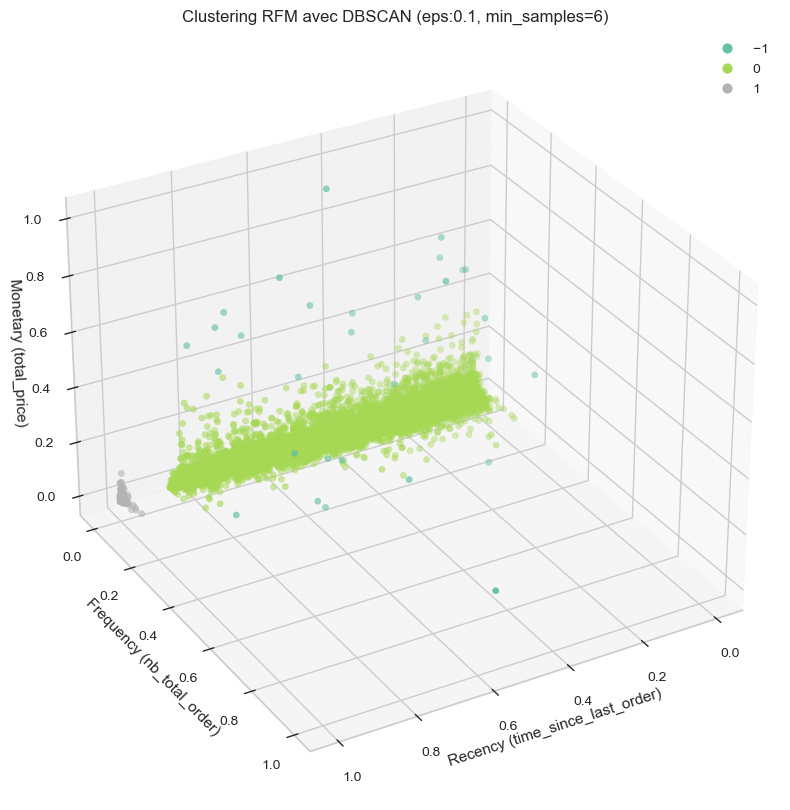

In [59]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d', azim=60, elev=30)
scatter = ax.scatter(rfm_scaled.iloc[:, 0],
                     rfm_scaled.iloc[:, 1],
                     rfm_scaled.iloc[:, 2],
                     c=db_lab_01,
                     cmap=plt.cm.Set2)

ax.legend(*scatter.legend_elements())
ax.set_xlabel('Recency (time_since_last_order)')
ax.set_ylabel('Frequency (nb_total_order)')
ax.set_zlabel('Monetary (total_price)')
ax.set_title('Clustering RFM avec DBSCAN (eps:0.1, min_samples=6)')

plt.show()

In [60]:
rfm_db_01 = rfm.copy()
rfm_db_01['cluster'] = db_lab_01
rfm_db_01 = rfm_db_01[rfm_db_01['cluster'] != -1]

In [61]:
rfm_db_01.groupby('cluster').mean()

,Recency,Frequency,Monetary
cluster,,,
0,235.681057,1.234945,146.796340
1,690.956522,1.280632,161.835494


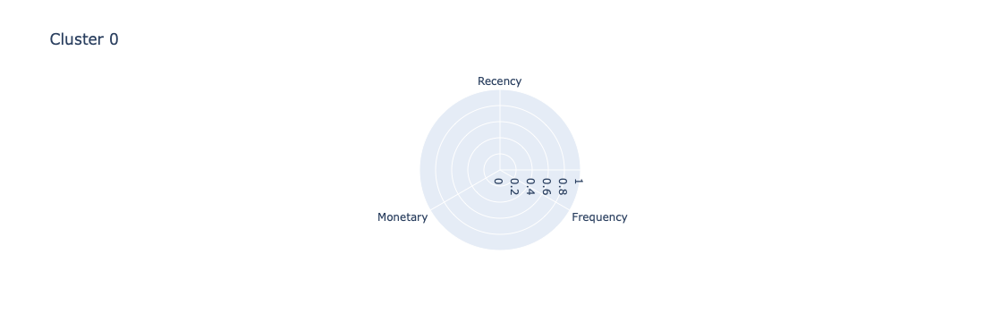

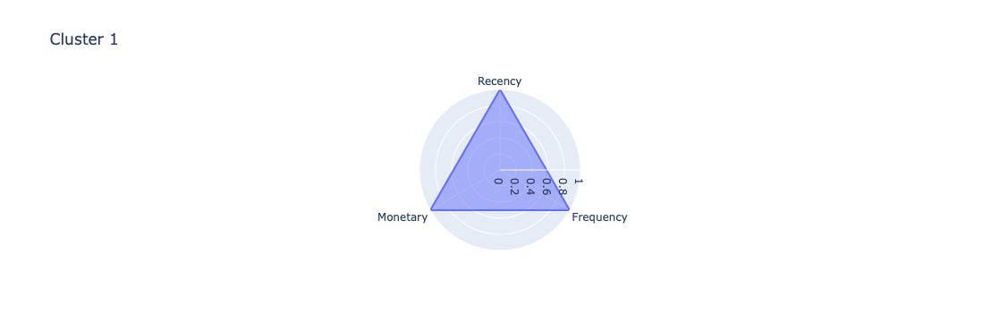

In [62]:
radar_cluster(rfm_db_01, 'cluster', strat='mean')

In [63]:
print('Paramètres du modèle : epsilon : 0.1, min_samples : 6.')
print('Nombre de clusters avec le modèle DBSCAN : ',
      len(set(db_lab_01)) - (1 if -1 in db_lab_01 else 0))
print('Nombre de points considérés comme du bruit: ',
      list(db_lab_01).count(-1))
print('Silhouette Score : ', silhouette_score(rfm_scaled, db_lab_01))
print('Davies Bouldin Score : ', davies_bouldin_score(rfm_scaled, db_lab_01))
print('Calinski Harabasz Score : ', calinski_harabasz_score(rfm_scaled,
                                                            db_lab_01))

Paramètres du modèle : epsilon : 0.1, min_samples : 6.
Nombre de clusters avec le modèle DBSCAN :  2
Nombre de points considérés comme du bruit:  31
Silhouette Score :  0.4876415604531913
Davies Bouldin Score :  1.0054772953103026
Calinski Harabasz Score :  1207.8292213149625


##### Modèle DBSCAN avec epsilon = 0.05 et min_samples = 6

In [64]:
db_rfm_05 = DBSCAN(eps=0.05, min_samples=6, n_jobs=-1)
db_rfm_05.fit(rfm_scaled)
db_lab_05 = db_rfm_05.labels_

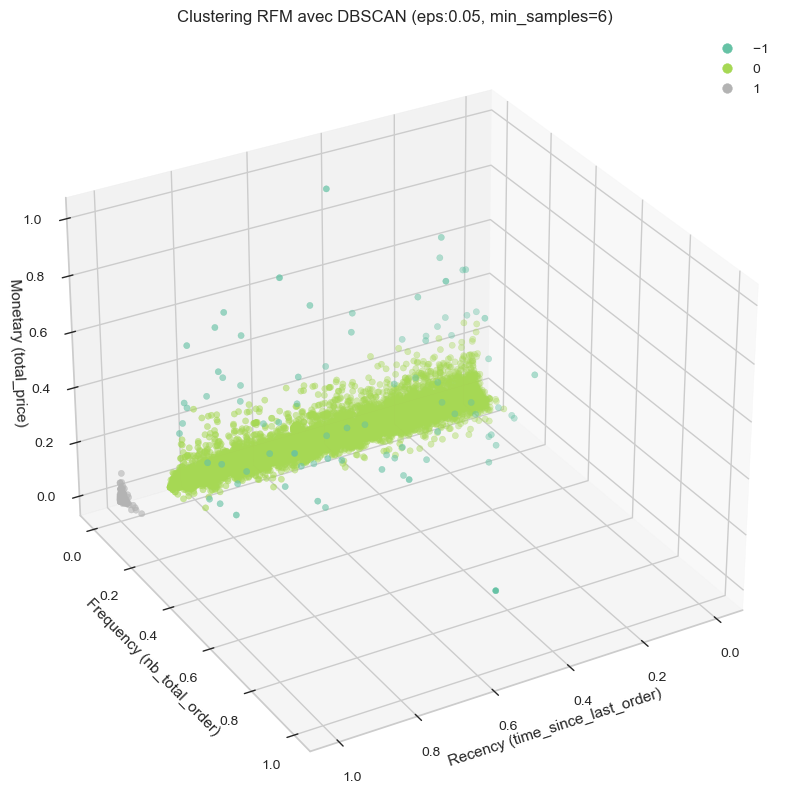

In [65]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d', azim=60, elev=30)
scatter = ax.scatter(rfm_scaled.iloc[:, 0],
                     rfm_scaled.iloc[:, 1],
                     rfm_scaled.iloc[:, 2],
                     c=db_lab_05,
                     cmap=plt.cm.Set2)

ax.legend(*scatter.legend_elements())
ax.set_xlabel('Recency (time_since_last_order)')
ax.set_ylabel('Frequency (nb_total_order)')
ax.set_zlabel('Monetary (total_price)')
ax.set_title('Clustering RFM avec DBSCAN (eps:0.05, min_samples=6)')

plt.show()

In [66]:
rfm_db_05 = rfm.copy()
rfm_db_05['cluster'] = db_lab_05
rfm_db_05 = rfm_db_05[rfm_db_05['cluster'] != -1]

In [67]:
rfm_db_05.groupby('cluster').mean()

,Recency,Frequency,Monetary
cluster,,,
0,235.647191,1.229881,145.578489
1,690.956522,1.280632,161.835494


In [68]:
rfm_scaled_db_05 = rfm_scaled.copy()
rfm_scaled_db_05['cluster'] = db_lab_05

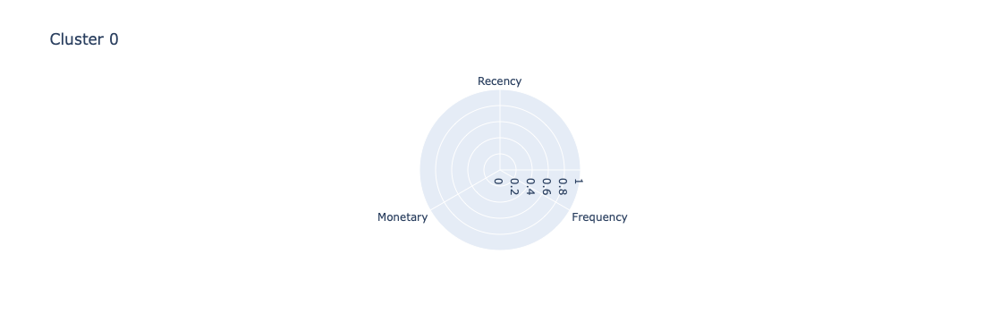

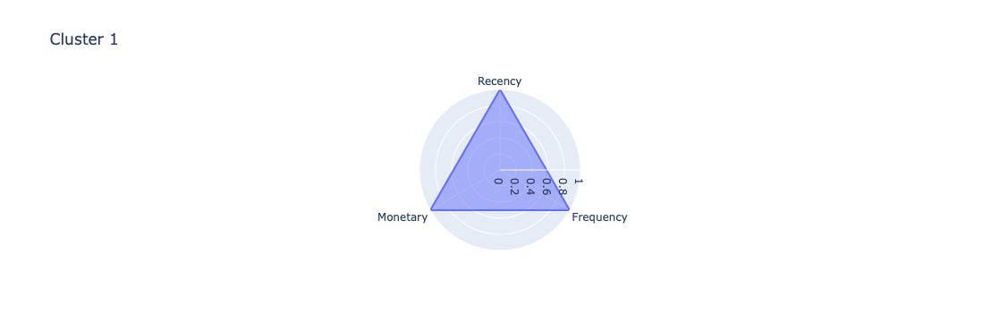

In [69]:
radar_cluster(rfm_db_05, 'cluster', strat='mean')

In [71]:
print('Paramètres du modèle : epsilon : 0.05, min_samples : 6.')
print('Nombre de clusters avec le modèle DBSCAN : ',
      len(set(db_lab_05)) - (1 if -1 in db_lab_05 else 0))
print('Nombre de points considérés comme du bruit: ',
      list(db_lab_05).count(-1))
print('Silhouette Score : ', silhouette_score(rfm_scaled, db_lab_05))
print('Davies Bouldin Score : ', davies_bouldin_score(rfm_scaled, db_lab_05))
print('Calinski Harabasz Score : ', calinski_harabasz_score(rfm_scaled,
                                                            db_lab_05))

Paramètres du modèle : epsilon : 0.05, min_samples : 6.
Nombre de clusters avec le modèle DBSCAN :  2
Nombre de points considérés comme du bruit:  82
Silhouette Score :  0.42051816457742075
Davies Bouldin Score :  1.3321571242439514
Calinski Harabasz Score :  1223.317059884656


##### Modèle DBSCAN avec epsilon = 0.03 et min_samples = 6

In [72]:
db_rfm_03 = DBSCAN(eps=0.03, min_samples=6, n_jobs=-1)
db_rfm_03.fit(rfm_scaled)
db_lab_03 = db_rfm_03.labels_

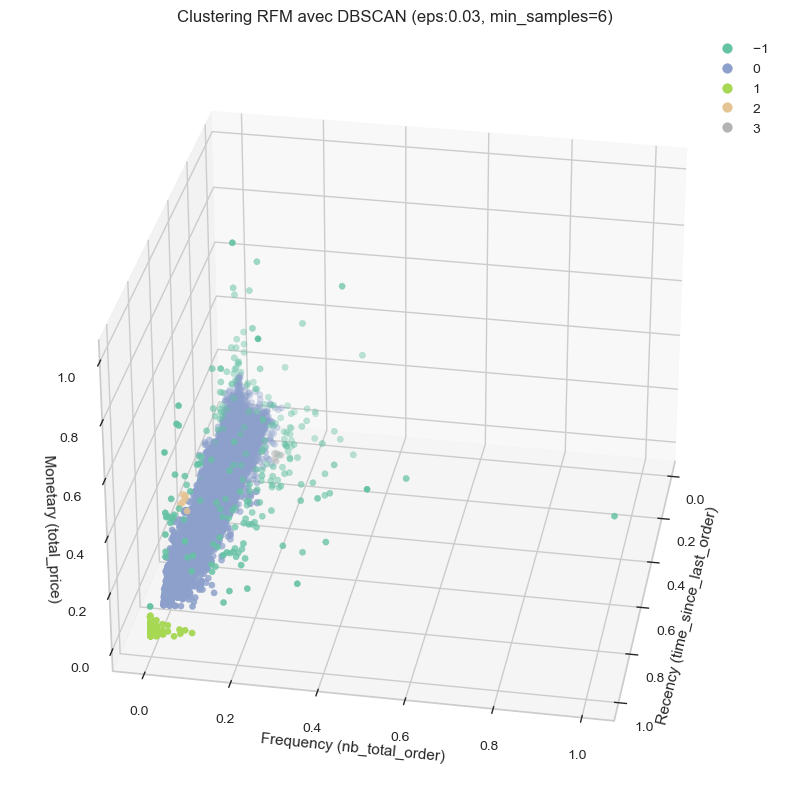

In [73]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d', azim=10, elev=30)
scatter = ax.scatter(rfm_scaled.iloc[:, 0],
                     rfm_scaled.iloc[:, 1],
                     rfm_scaled.iloc[:, 2],
                     c=db_lab_03,
                     cmap=plt.cm.Set2)

ax.legend(*scatter.legend_elements())
ax.set_xlabel('Recency (time_since_last_order)')
ax.set_ylabel('Frequency (nb_total_order)')
ax.set_zlabel('Monetary (total_price)')
ax.set_title('Clustering RFM avec DBSCAN (eps:0.03, min_samples=6)')

plt.show()

In [74]:
rfm_db_03 = rfm.copy()
rfm_db_03['cluster'] = db_lab_03
rfm_db_03 = rfm_db_03[rfm_db_03['cluster'] != -1]

In [75]:
rfm_db_03.groupby('cluster').mean()

,Recency,Frequency,Monetary
cluster,,,
0,235.604996,1.220759,143.096662
1,690.960317,1.281746,156.926111
2,447.000000,1.125000,2666.583750
3,165.600000,11.200000,809.750000


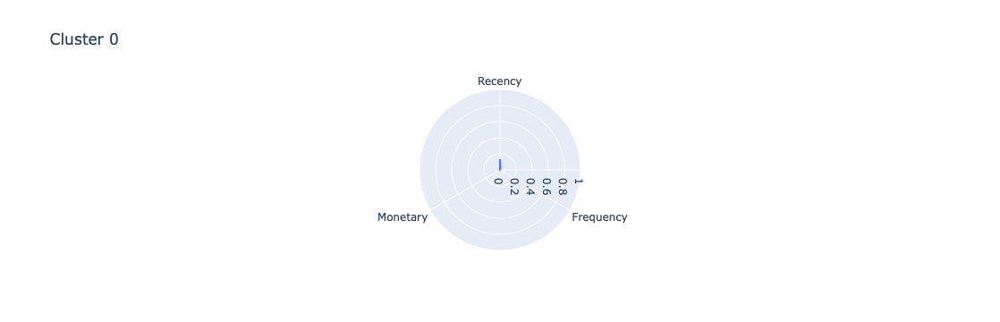

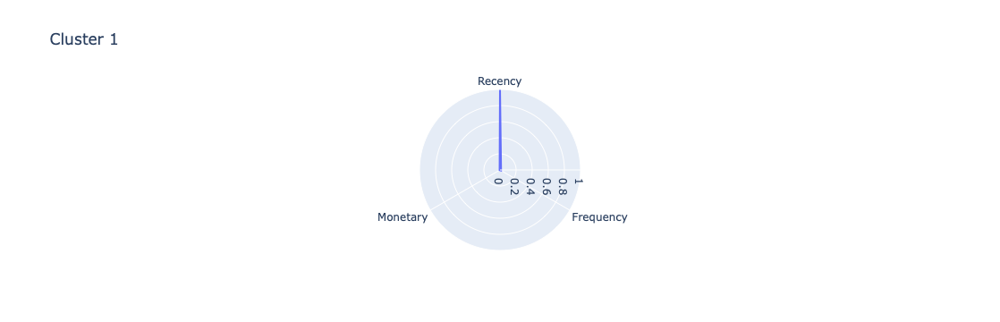

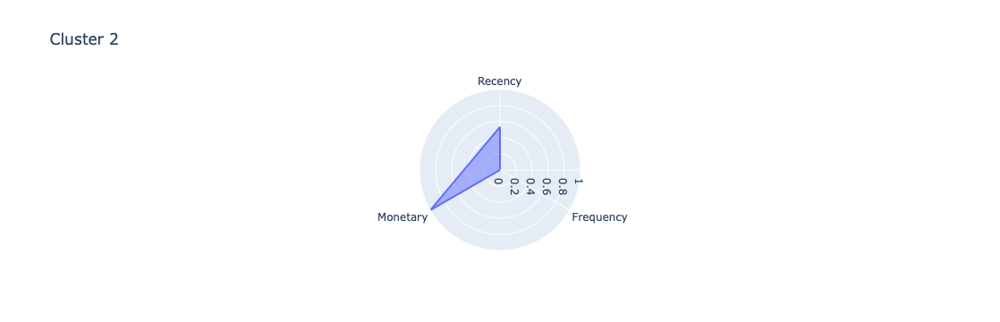

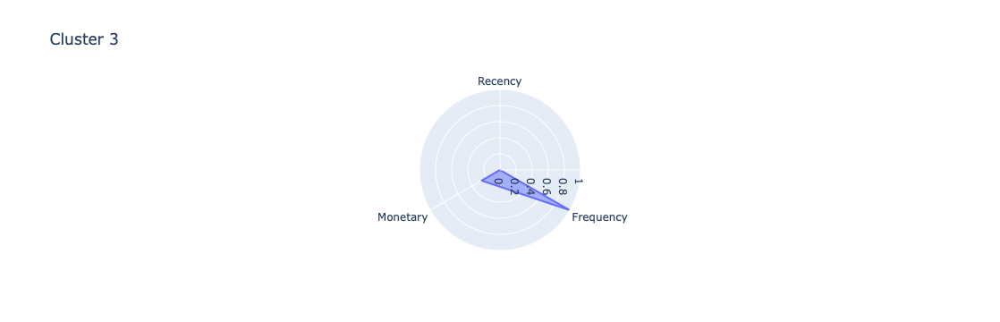

In [76]:
radar_cluster(rfm_db_03, 'cluster', strat='mean')

In [77]:
print('Paramètres du modèle : epsilon : 0.03, min_samples : 6.')
print('Nombre de clusters avec le modèle DBSCAN : ',
      len(set(db_lab_03)) - (1 if -1 in db_lab_03 else 0))
print('Nombre de points considérés comme du bruit: ',
      list(db_lab_03).count(-1))
print('Silhouette Score : ', silhouette_score(rfm_scaled, db_lab_03))
print('Davies Bouldin Score : ', davies_bouldin_score(rfm_scaled, db_lab_03))
print('Calinski Harabasz Score : ', calinski_harabasz_score(rfm_scaled,
                                                            db_lab_03))

Paramètres du modèle : epsilon : 0.03, min_samples : 6.
Nombre de clusters avec le modèle DBSCAN :  4
Nombre de points considérés comme du bruit:  217
Silhouette Score :  -0.17824029183999737
Davies Bouldin Score :  1.5521972301136284
Calinski Harabasz Score :  623.1058652413222


Nous avons ici 4 clusters ainsi que 217 points considérés comme du bruit. Encore une fois, les différents scores représentés sont mauvais. 

Les clusters sont :

- cluster 1 : les clients ont acheté il n'y a pas très longtemps pour un montant faible.
- cluster 2 : les clients ont acheté il y a longtemps pour un montant faible.
- cluster 3 : les clients ont acheté il y a relativement longtemps pour un montant élevé.
- cluster 4 : les clients ont acheté fréquemment pour un montant moyennement élevé.

L'étude de la modélisation avec DBSCAN n'est pas concluante. 

En effet, les clusters identifiés ne sont pas nécessairement meilleurs que ceux du kmeans d'un point de vue interprétation métier. De plus, les scores de ces modèles sont mauvais, ils indiquent que les clusters sont mal séparés, ils sont proches et dispersés. Certains points sont également considérés comme du bruit et ne sont donc pas inclus dans les clusters.

Nous décidons donc de ne pas utiliser ce modèle par la suite.

Nous allons désormais appliquer un nouveau modèle à la segmentation RFM : le Clustering hierarchique.

## 2.4 Classification Ascendante hierarchique (CAH)

La Classification Ascendante Hiérarchique (CAH), ou clustering hiérarchique, est une méthode de segmentation qui construit une hiérarchie de clusters sous forme d’arbre (dendrogramme). Contrairement à K-Means ou DBSCAN, elle ne nécessite pas de fixer à l’avance le nombre de groupes : les clusters sont créés en fusionnant progressivement les observations ou groupes les plus proches, jusqu’à obtenir une structure arborescente complète. L’analyse du dendrogramme permet ensuite de choisir le nombre de clusters optimal en coupant l’arbre à un certain niveau. Cette approche est particulièrement utile pour explorer la structure des données et visualiser les relations entre groupes.

In [78]:
kmeans_global = mod_rfm_final_4

In [79]:
ARI = []
for s in [5000, 10000, 30000, 50000, 70000, 90000]:
    X = rfm.sample(n=s, random_state=0).copy()
    X_scaled = pd.DataFrame(preprocessor.fit_transform(X),
                            index=X.index,
                            columns=X.columns)

    kmeans_sample = KMeans(4, random_state=0)
    kmeans_sample.fit(X_scaled)
    kmeans_sample_lab = kmeans_sample.predict(X_scaled)

    kmeans_lab = kmeans_global.predict(X_scaled)

    ARI_score = adjusted_rand_score(kmeans_lab, kmeans_sample_lab)
    ARI.append([s, ARI_score])

print('Voici les scores ARI pour chaque sample :')
display(pd.DataFrame(ARI, columns=['Échantillons', 'ARI']))

/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of

Voici les scores ARI pour chaque sample :


,Échantillons,ARI
0,5000,0.954269
1,10000,0.988204
2,30000,0.977649
3,50000,0.991371
4,70000,0.997251
5,90000,0.992897


Nous sélectionnons donc 5000 observations. Valeur qui nous permet de réduire notre data set tout en gardant un score ARI très élevé.

In [80]:
X_reduced = rfm.sample(n=5000, random_state=0).copy()

In [81]:
col_quanti = X_reduced.select_dtypes(['int64', 'float64']).columns
col_quali = X_reduced.select_dtypes(['category', 'object', 'bool']).columns

minmax_scale = MinMaxScaler()
ohe = OneHotEncoder()

preprocessor = ColumnTransformer(transformers=[
    ('quanti', minmax_scale, col_quanti),
    ('quali', ohe, col_quali)
])

In [82]:
X_red_scaled = pd.DataFrame(preprocessor.fit_transform(X_reduced),
                            index=X_reduced.index,
                            columns=X_reduced.columns)

In [83]:
Z = linkage(X_red_scaled, method="ward")

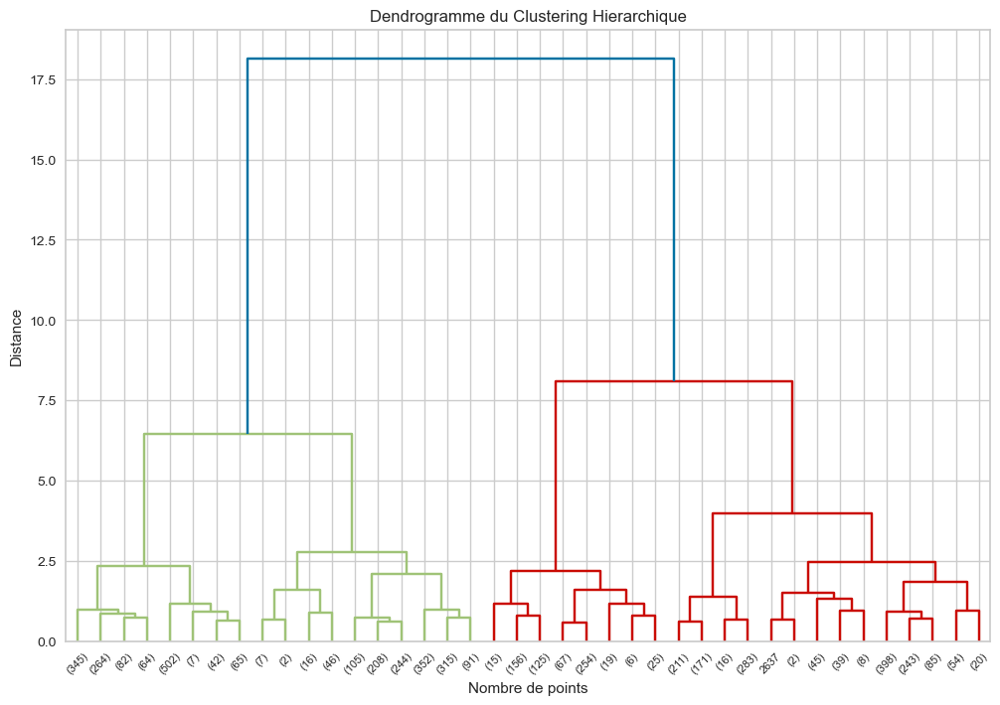

In [84]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

_ = dendrogram(Z, p=40, truncate_mode="lastp", ax=ax)

plt.title("Dendrogramme du Clustering Hierarchique")
plt.xlabel("Nombre de points")
plt.ylabel("Distance")
plt.show()

Le dendrogramme nous permet d'observer que 2, 3 ou 4 clusters semblent être des séparations idéales.

Nous allons désormais déterminer les silhouettes scores et labels associés à différents nombres de clusters avec AgglomerativeClustering.

In [85]:
k_sil_lab = []
mod_cah = []

for k in range(2, 9):
    cah = AgglomerativeClustering(n_clusters=k)
    cah.fit(X_red_scaled)

    cah_lab = cah.labels_
    score = silhouette_score(X_red_scaled, cah_lab)

    k_sil_lab.append([k, score, cah_lab])
    mod_cah.append([k, cah])
    print('Boucle k = {} terminée'.format(k))

display(k_sil_lab)

Boucle k = 2 terminée
Boucle k = 3 terminée
Boucle k = 4 terminée
Boucle k = 5 terminée
Boucle k = 6 terminée
Boucle k = 7 terminée
Boucle k = 8 terminée


[[2, 0.5360108304390467, array([1, 0, 1, ..., 1, 0, 0])],
 [3, 0.4754148956994245, array([0, 1, 0, ..., 0, 2, 1])],
 [4, 0.4348522713352451, array([3, 0, 3, ..., 1, 2, 0])],
 [5, 0.41496518955270983, array([3, 1, 3, ..., 0, 2, 4])],
 [6, 0.4257126736474296, array([1, 0, 1, ..., 3, 2, 4])],
 [7, 0.43241466988897764, array([0, 6, 0, ..., 1, 2, 4])],
 [8, 0.38400085070785034, array([7, 6, 5, ..., 1, 0, 4])]]

On constate bien que pour les valeurs de n_clusters allant de 2 à 4, les silhouette score sont meilleurs. Nous observerons donc les caractéristiques des clusters pour ces différentes segmentations.

In [86]:
print('Paramètres du modèle CAH: k=2.')
print('Silhouette Score : ', silhouette_score(X_red_scaled, k_sil_lab[0][2]))
print('Davies Bouldin Score : ', davies_bouldin_score(X_red_scaled,
                                                      k_sil_lab[0][2]))
print('Calinski Harabasz Score : ', calinski_harabasz_score(X_red_scaled,
                                                            k_sil_lab[0][2]))

Paramètres du modèle CAH: k=2.
Silhouette Score :  0.5360108304390467
Davies Bouldin Score :  0.6540014383371039
Calinski Harabasz Score :  8430.294670247731


In [87]:
X_red_cah_k2 = X_reduced.copy()
X_red_cah_k2['cluster'] = k_sil_lab[0][2]

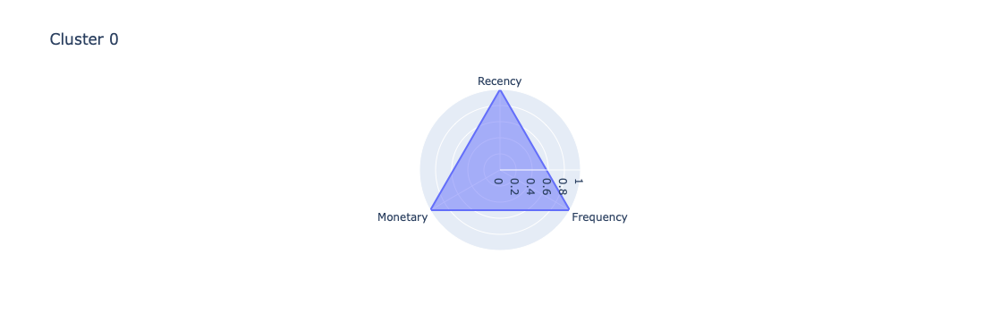

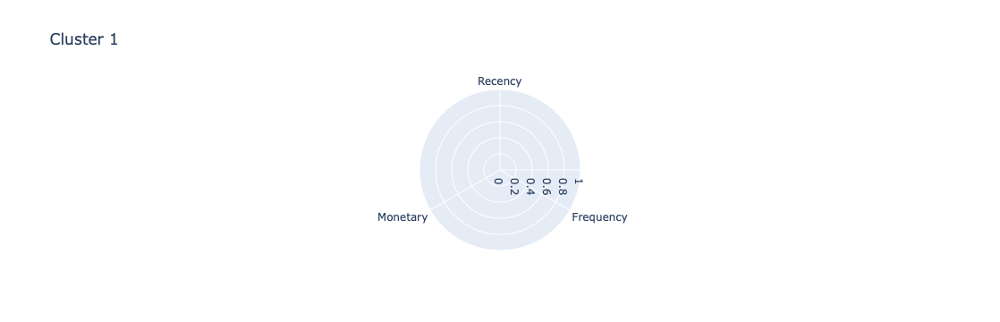

In [88]:
radar_cluster(X_red_cah_k2, 'cluster', strat='mean')

In [89]:
print('Paramètres du modèle CAH: k=3.')
print('Silhouette Score : ', silhouette_score(X_red_scaled, k_sil_lab[1][2]))
print('Davies Bouldin Score : ', davies_bouldin_score(X_red_scaled,
                                                      k_sil_lab[1][2]))
print('Calinski Harabasz Score : ', calinski_harabasz_score(X_red_scaled,
                                                            k_sil_lab[1][2]))

Paramètres du modèle CAH: k=3.
Silhouette Score :  0.4754148956994245
Davies Bouldin Score :  0.6658757411957921
Calinski Harabasz Score :  7599.410930338923


In [90]:
X_red_cah_k3 = X_reduced.copy()
X_red_cah_k3['cluster'] = k_sil_lab[1][2]

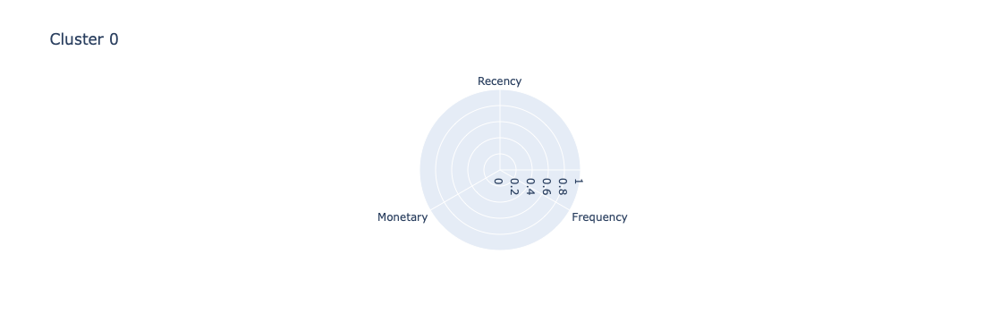

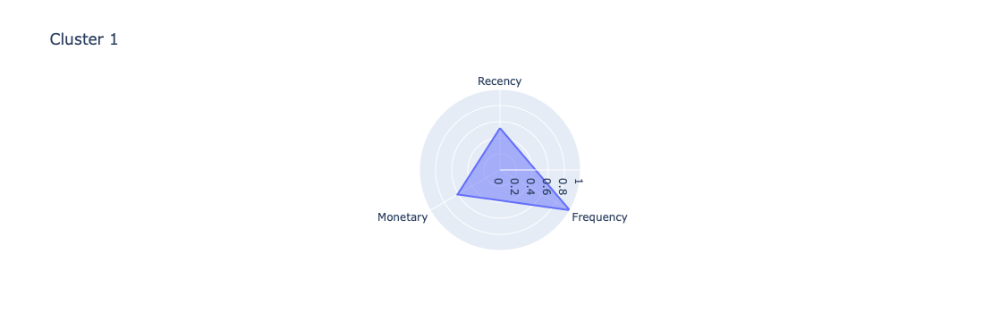

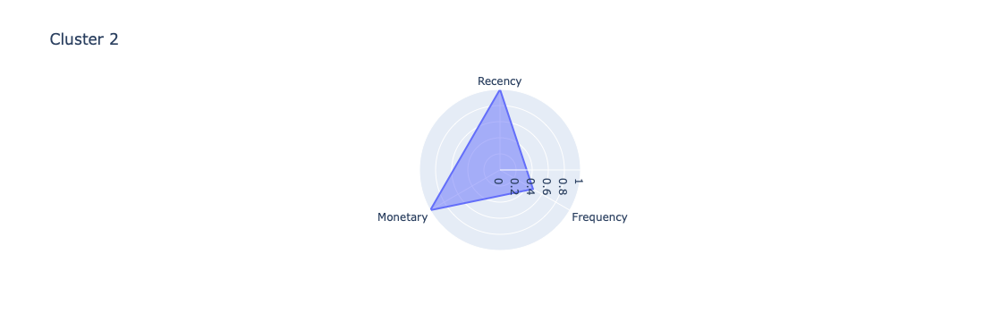

In [91]:
radar_cluster(X_red_cah_k3, 'cluster', strat='mean')

In [92]:
print('Paramètres du modèle CAH: k=4.')
print('Silhouette Score : ', silhouette_score(X_red_scaled, k_sil_lab[2][2]))
print('Davies Bouldin Score : ', davies_bouldin_score(X_red_scaled,
                                                      k_sil_lab[2][2]))
print('Calinski Harabasz Score : ', calinski_harabasz_score(X_red_scaled,
                                                            k_sil_lab[2][2]))

Paramètres du modèle CAH: k=4.
Silhouette Score :  0.4348522713352451
Davies Bouldin Score :  0.72557850022454
Calinski Harabasz Score :  8224.546173437928


In [93]:
X_red_cah_k4 = X_reduced.copy()
X_red_cah_k4['cluster'] = k_sil_lab[2][2]

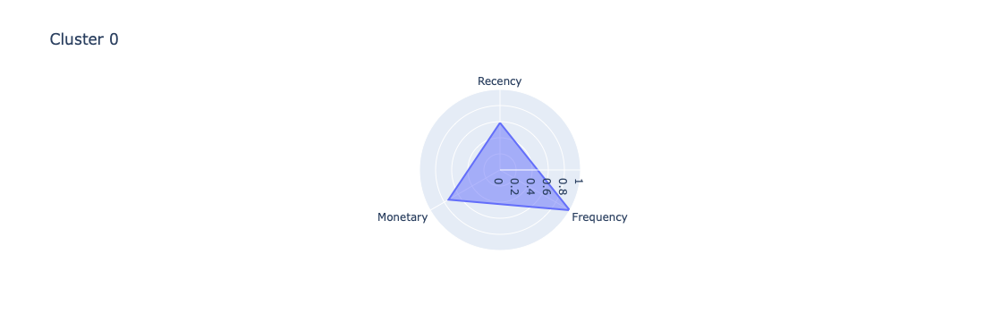

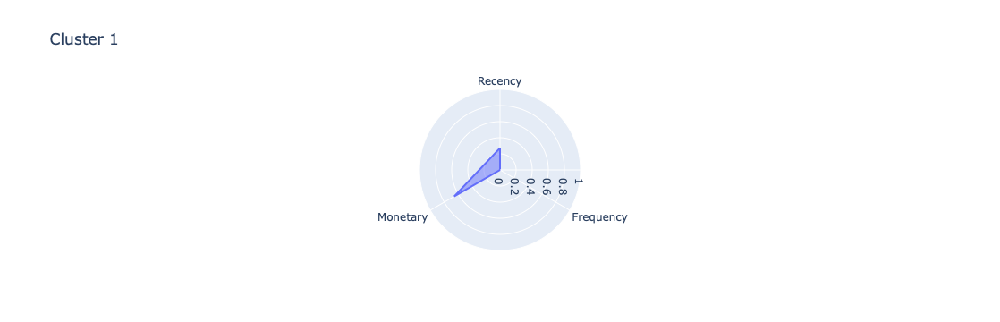

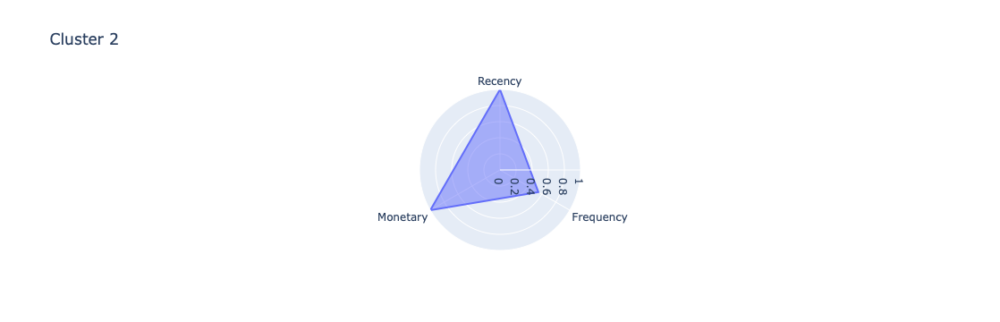

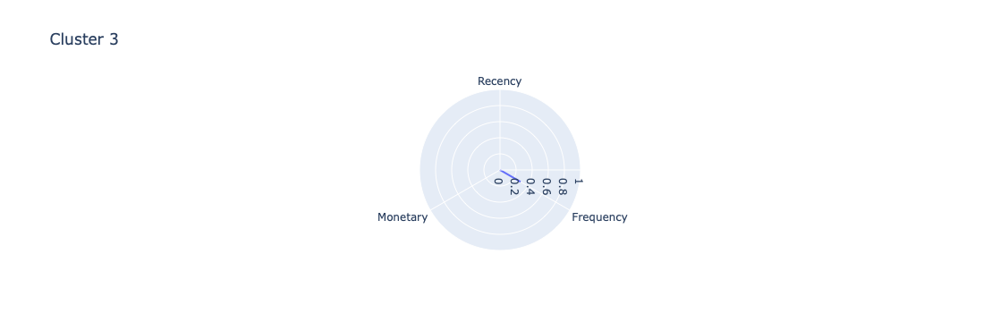

In [94]:
radar_cluster(X_red_cah_k4, 'cluster', strat='mean')

# 3. Segmentation RFM + score

In [95]:
rfm_score = data[['customer_unique_id', 'time_since_last_order',
                  'nb_total_order', 'total_price',
                  'mean_review_score']].copy()

In [96]:
rfm_score = rfm_score.set_index('customer_unique_id')
rfm_score.columns = ['Recency', 'Frequency', 'Monetary', 'Score']

In [97]:
rfm_score.head()

,Recency,Frequency,Monetary,Score
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,1,129.90,5.0
0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,18.90,4.0
0000f46a3911fa3c0805444483337064,536,1,69.00,3.0
0000f6ccb0745a6a4b88665a16c9f078,320,1,25.99,4.0
0004aac84e0df4da2b147fca70cf8255,287,1,180.00,5.0


In [98]:
col_quanti = rfm_score.select_dtypes(['int64', 'float64']).columns
col_quali = rfm_score.select_dtypes(['category', 'object', 'bool']).columns

minmax_scale = MinMaxScaler()
ohe = OneHotEncoder()

preprocessor = ColumnTransformer(transformers=[
    ('quanti', minmax_scale, col_quanti),
    ('quali', ohe, col_quali)
])

In [99]:
rfm_score_scaled = pd.DataFrame(preprocessor.fit_transform(rfm_score),
                                index=rfm_score.index,
                                columns=rfm_score.columns)
rfm_score_scaled.head()

,Recency,Frequency,Monetary,Score
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,0.159942,0.0,0.009603,1.00
0000b849f77a49e4a4ce2b2a4ca5be3f,0.164265,0.0,0.001343,0.75
0000f46a3911fa3c0805444483337064,0.772334,0.0,0.005071,0.50
0000f6ccb0745a6a4b88665a16c9f078,0.461095,0.0,0.001871,0.75
0004aac84e0df4da2b147fca70cf8255,0.413545,0.0,0.013330,1.00


De la même manière que pour le précédent dataframe, nous modélisons nos clusters à l'aide d'un kmeans.

## 3.1 KElbowVisualizer

Nous déterminons le nombre de cluster optimal avec la méthode du coude, puis nous observerons les différents clusters trouvés à l'aide d'un silhouette visualizer.

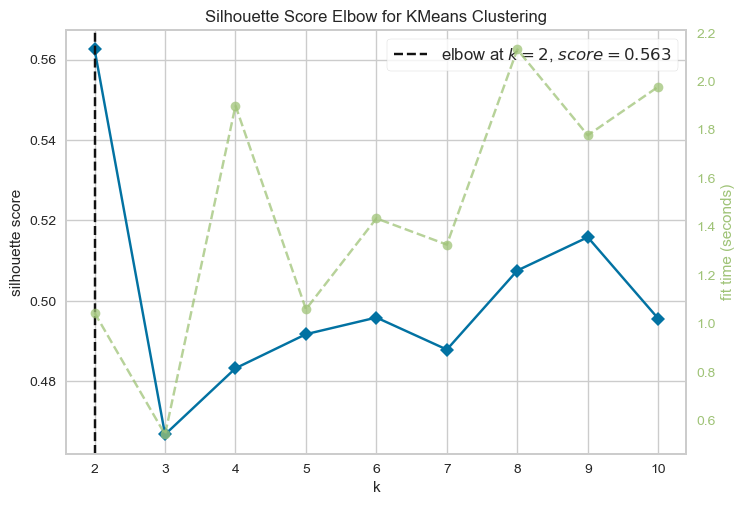

In [100]:
vis = elbow_visualizer(2, 11, rfm_score_scaled, 'silhouette')

In [101]:
recap_kmeans_rfm_score = pd.DataFrame(data={'k': np.arange(2, 11),
                                            'sil_scores': vis.k_scores_,
                                            'temps': vis.k_timers_})

In [102]:
recap_kmeans_rfm_score

,k,sil_scores,temps
0,2,0.562538,1.043686
1,3,0.466764,0.541344
2,4,0.483233,1.899541
3,5,0.491708,1.058651
4,6,0.495857,1.433930
5,7,0.487881,1.325595
6,8,0.507551,2.131788
7,9,0.515837,1.777304
8,10,0.495592,1.977852


In [103]:
k_select = vis.elbow_value_

In [104]:
k_select

2

La méthode du coude basé sur le score de silhouette nous indique que la segmentation en 2 clusters (k=2) semble la plus optimale.

## 3.2 Silhouette Visualizer

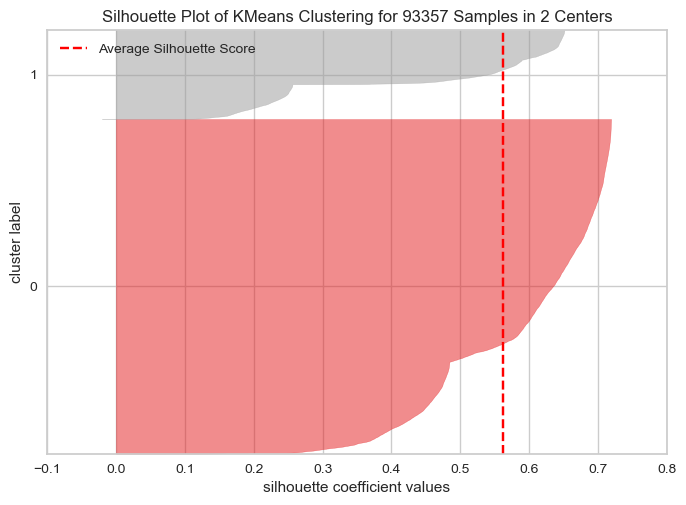

SilhouetteVisualizer(ax=<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 93357 Samples in 2 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     estimator=KMeans(n_clusters=2, n_init=10, random_state=42))

In [105]:
silhouette_visualizer(2, rfm_score_scaled)

On constate ici que le cluster 1 est très large contrairement au 0. Cela se produit parce que la largeur de chaque silhouette est proportionnelle au nombre d'échantillons affectés au cluster. Il y a donc énormément d'échantillons affectés à ce cluster. À l'inverse, le cluster 0 en comporte moins.

Les silhouettes score sont positifs, ce qui signifie qu'aucune erreur n'a été effectuée. Le silhouette score moyen se situe au-dessus de 0.55.

Nous observons ensuite le k optimal trouvé par le elbow visualizer avec d'autres métriques afin de le comparer avec celui trouvé précédemment.

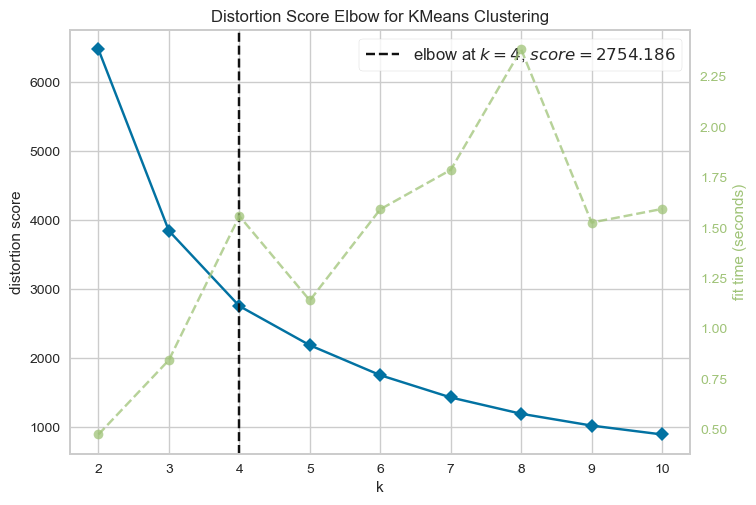

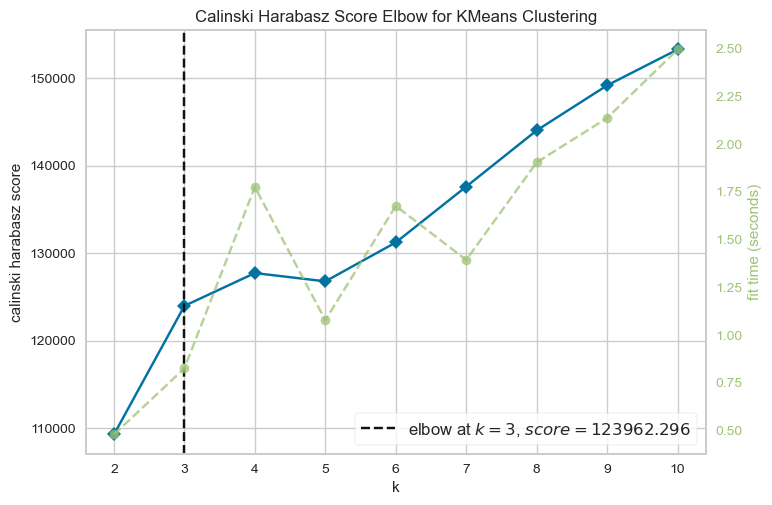

In [106]:
metrics = ["distortion", "calinski_harabasz"]

for m in metrics:
    elbow_visualizer(2, 11, rfm_score_scaled, m)

La méthode du coude avec le score de distortion nous indique un k optimal de 4. Avec la métrique 'calinski_harabasz', le choix se porte plutôt sur k = 3.

Nous allons désormais également étudier le graphique silhouette pour ces différents clustering.

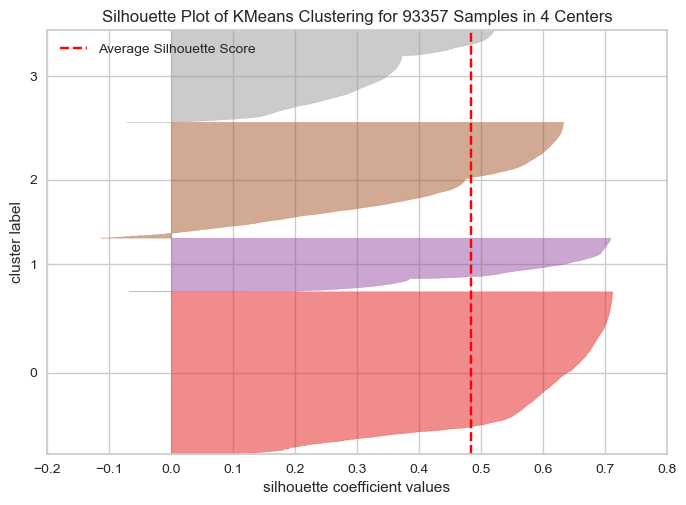

SilhouetteVisualizer(ax=<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 93357 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     estimator=KMeans(n_clusters=4, n_init=10, random_state=42))

In [107]:
silhouette_visualizer(4, rfm_score_scaled)

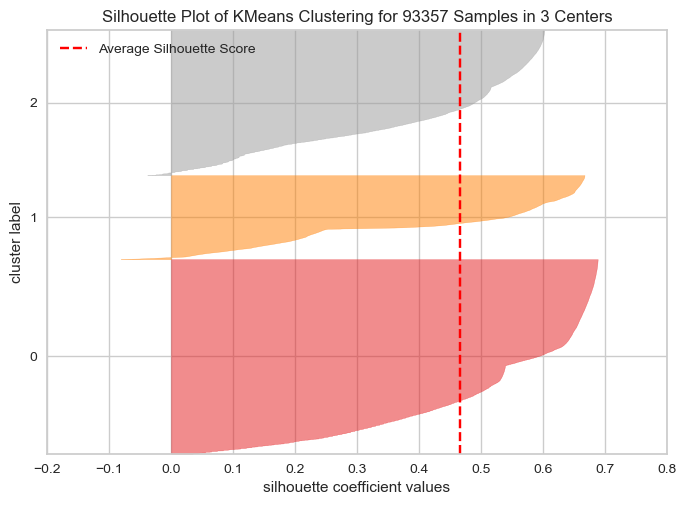

SilhouetteVisualizer(ax=<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 93357 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     estimator=KMeans(n_clusters=3, n_init=10, random_state=42))

In [108]:
silhouette_visualizer(3, rfm_score_scaled)

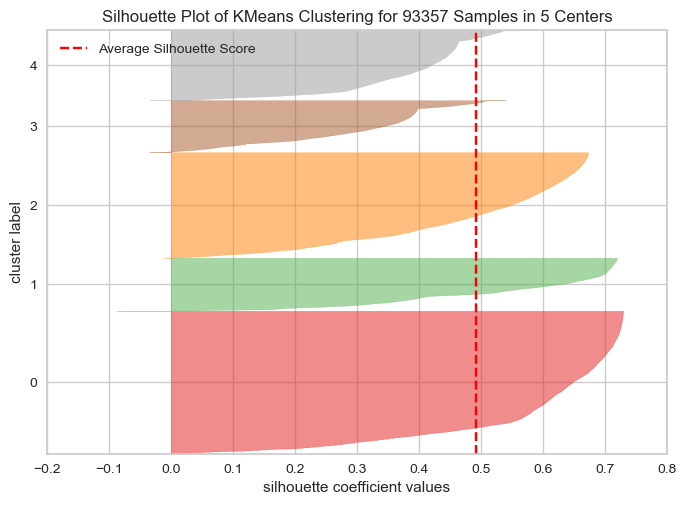

SilhouetteVisualizer(ax=<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 93357 Samples in 5 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     estimator=KMeans(n_clusters=5, n_init=10, random_state=42))

In [109]:
silhouette_visualizer(5, rfm_score_scaled)

Pour k = 4, les différents clusters sont mal repartis et hétérogènes. En effet, le clusters 3 est très large tandis que le 2 est beaucoup plus fin. On constate également des observations qui semblent avoir un silhouette score négatif dans les clusters 1 et 2. Ces dernières sont possiblement mal classées. Le silhouette score moyen est cependant positif, un peu en deça de 0.5.

Pour k = 3, les différents clusters sont hétérogènes. Les clusters 0 et 2 sont plus larges que le 1. Il existe également des observations avec un silhouette score négatif dans les clusters 0 et 1. Le silhouette score moyen est également un peu en deça de 0.5.

## 3.3 Distance intercluster

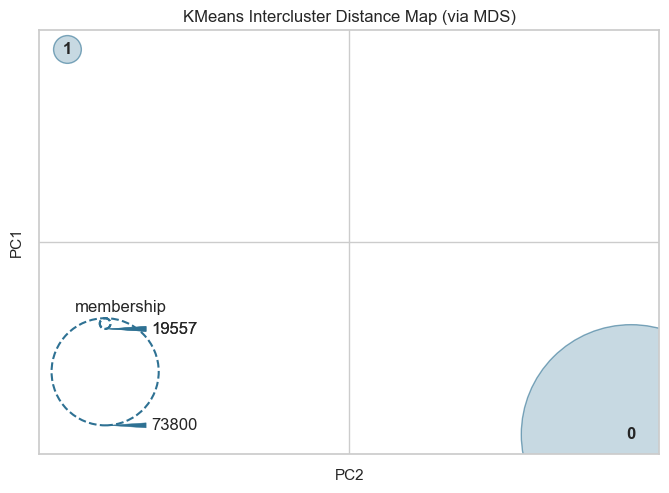

InterclusterDistance(ax=<Axes: title={'center': 'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>,
                     estimator=KMeans(n_clusters=2, n_init=10, random_state=42))

In [110]:
distance_visualizer(2, rfm_score_scaled)

/opt/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_mds.py:601: UserWarning:

The MDS API has changed. ``fit`` now constructs an dissimilarity matrix from data. To use a custom dissimilarity matrix, set ``dissimilarity='precomputed'``.



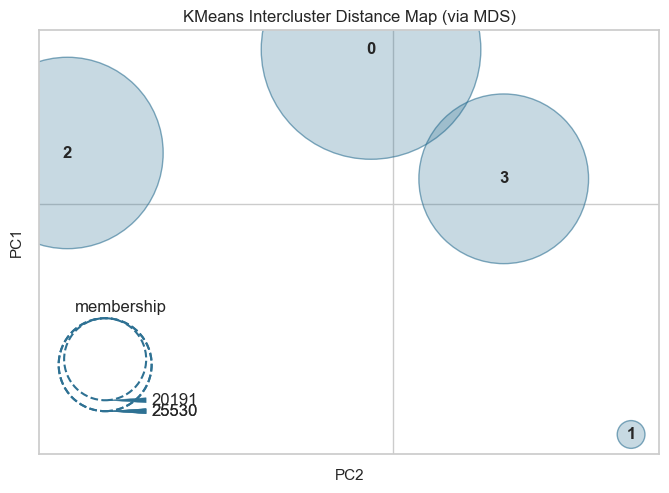

InterclusterDistance(ax=<Axes: title={'center': 'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>,
                     estimator=KMeans(n_clusters=4, n_init=10, random_state=42))

In [111]:
distance_visualizer(4, rfm_score_scaled)

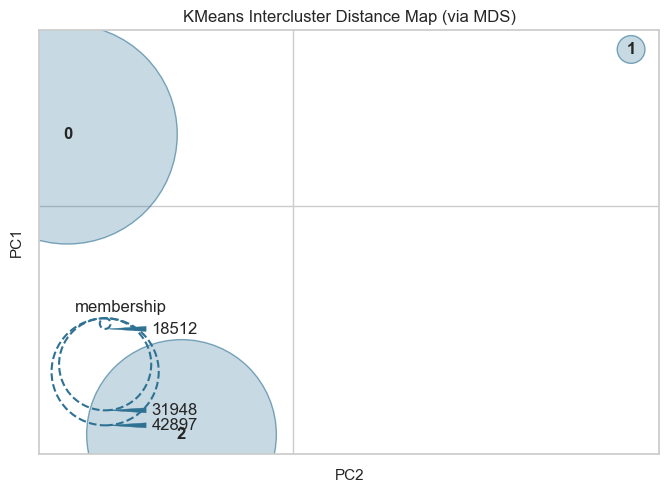

InterclusterDistance(ax=<Axes: title={'center': 'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>,
                     estimator=KMeans(n_clusters=3, n_init=10, random_state=42))

In [112]:
distance_visualizer(3, rfm_score_scaled)

Les clusters sont bien séparés pour les différents clustering (k = 2, 3, 4) malgré que les clusters 0 et 3 se chevauchent légèrement dans le clustering k = 4. Encore une fois, des clusters qui se chevauchent dans l'espace 2D, n'implique pas qu'ils se chevauchent dans l'espace des caractéristiques d'origine.

## 3.4 Analyse métiers des différents clustering

Nous allons désormais identifier les caractéristiques métiers des clusters des différents clustering (k = 2, 3 et 4).

##### Modèle kmeans avec k = 2

In [113]:
mod_rfm_score_final = KMeans(n_clusters=k_select, random_state=42)
mod_rfm_score_final.fit(rfm_score_scaled)

/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



KMeans(n_clusters=2, random_state=42)

In [114]:
rfm_score_lab = mod_rfm_score_final.predict(rfm_score_scaled)

In [115]:
rfm_score_kmeans_scaled = rfm_score_scaled.copy()
rfm_score_kmeans_scaled['cluster'] = rfm_score_lab

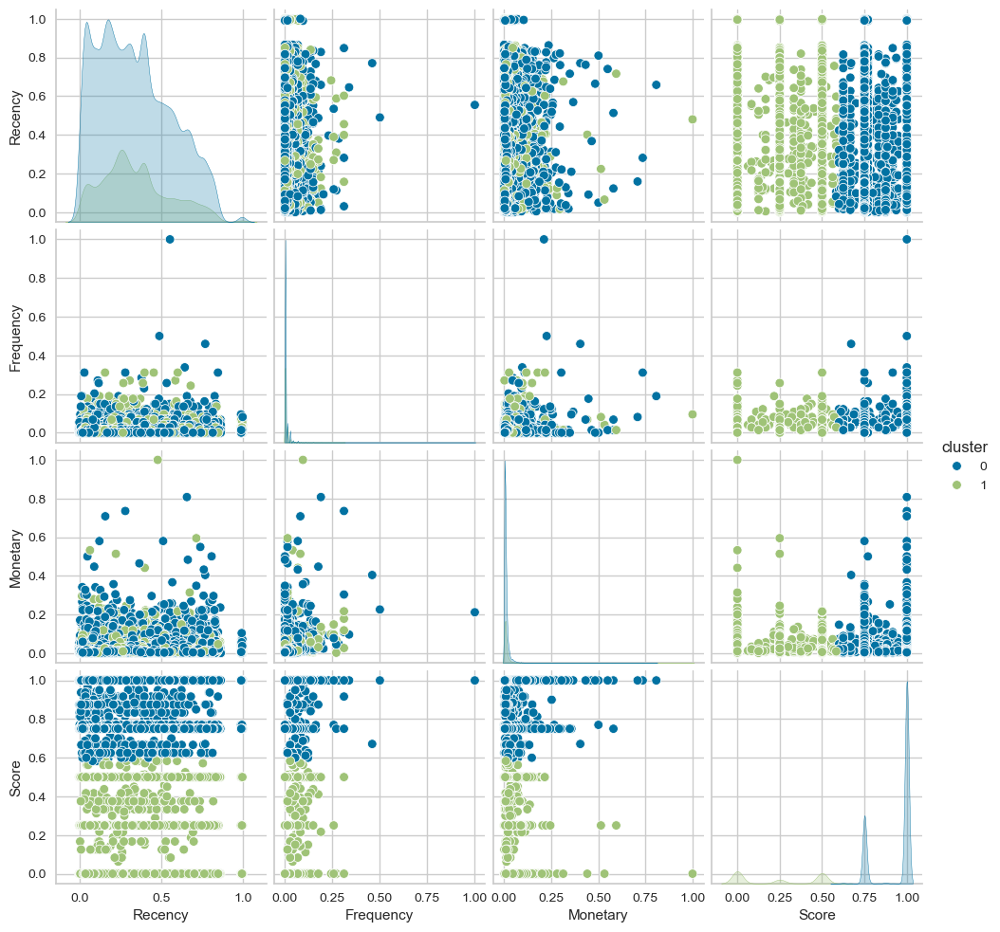

In [116]:
sns.pairplot(rfm_score_kmeans_scaled, hue="cluster")

In [117]:
rfm_score_kmeans = rfm_score.copy()
rfm_score_kmeans['cluster'] = rfm_score_lab

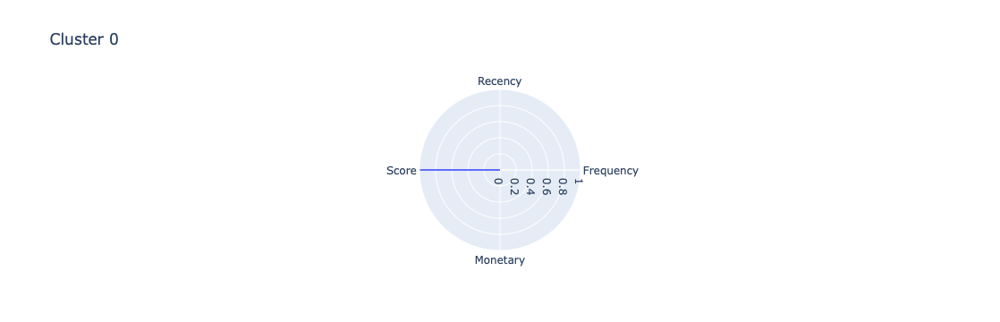

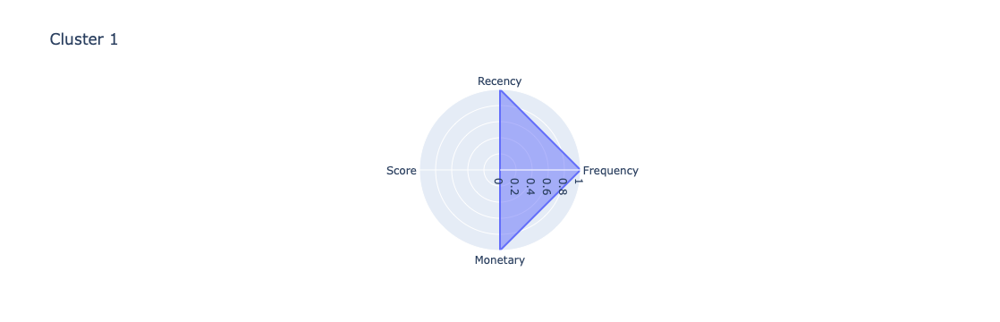

In [118]:
radar_cluster(rfm_score_kmeans, 'cluster', strat='mean')

In [119]:
print('Paramètres du modèle kmeans : k=2.')
print('Silhouette Score : ', silhouette_score(rfm_score_scaled, rfm_score_lab))
print('Davies Bouldin Score : ', davies_bouldin_score(rfm_score_scaled,
                                                      rfm_score_lab))
print('Calinski Harabasz Score : ', calinski_harabasz_score(rfm_score_scaled,
                                                            rfm_score_lab))

Paramètres du modèle kmeans : k=2.
Silhouette Score :  0.5625376798876929
Davies Bouldin Score :  0.7424381340016313
Calinski Harabasz Score :  109250.60398044907


##### Modèle kmeans avec k = 4

In [120]:
mod_rfm_score_k4 = KMeans(n_clusters=4, random_state=0)
mod_rfm_score_k4.fit(rfm_score_scaled)

/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



KMeans(n_clusters=4, random_state=0)

In [121]:
rfm_score_lab_k4 = mod_rfm_score_k4.predict(rfm_score_scaled)

In [122]:
rfm_score_kmeans_scaled_k4 = rfm_score_scaled.copy()
rfm_score_kmeans_scaled_k4['cluster'] = rfm_score_lab_k4

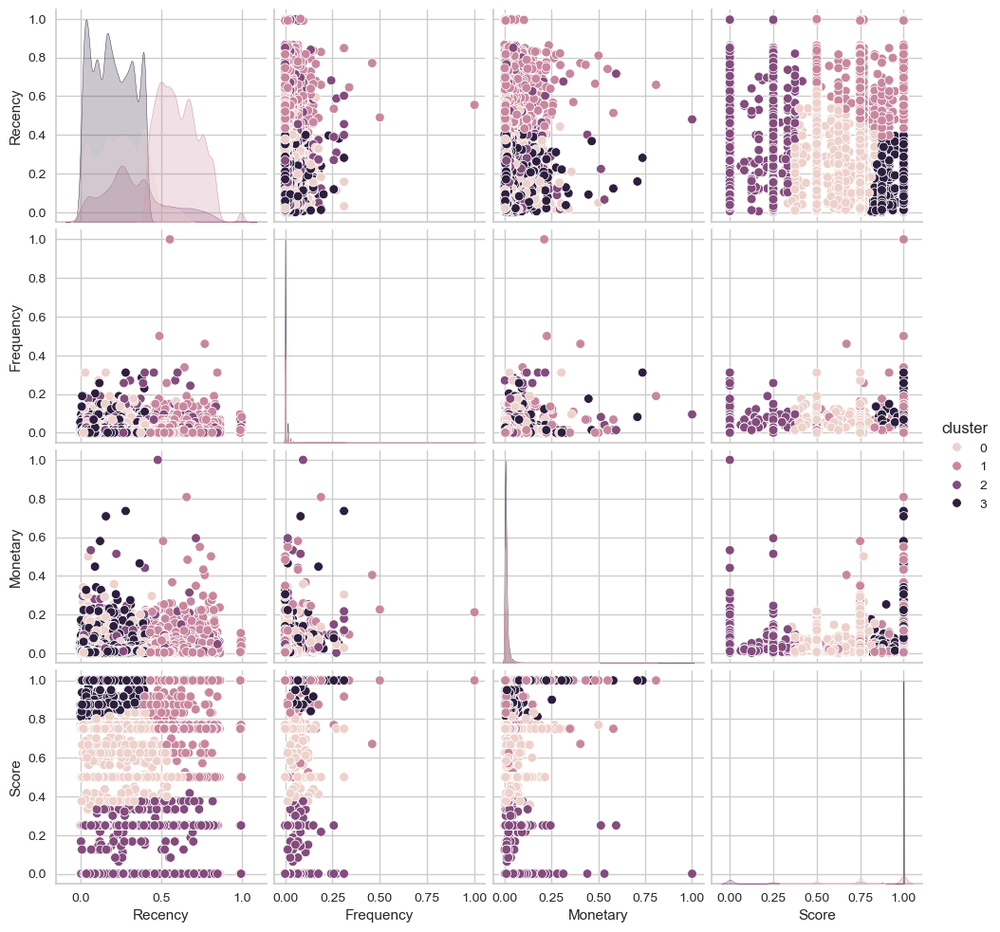

In [123]:
sns.pairplot(rfm_score_kmeans_scaled_k4, hue="cluster")

In [124]:
rfm_score_kmeans_k4 = rfm_score.copy()
rfm_score_kmeans_k4['cluster'] = rfm_score_lab_k4

In [125]:
rfm_score_kmeans_k4.groupby('cluster').mean()

,Recency,Frequency,Monetary,Score
cluster,,,,
0,175.739884,1.239067,143.014529,3.663306
1,422.293028,1.222718,150.077874,4.703409
2,236.203618,1.416195,172.411319,1.247690
3,139.524284,1.193437,142.925401,4.996675


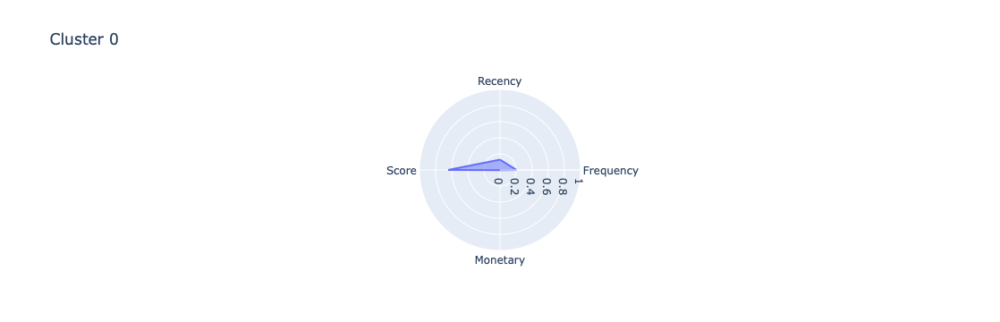

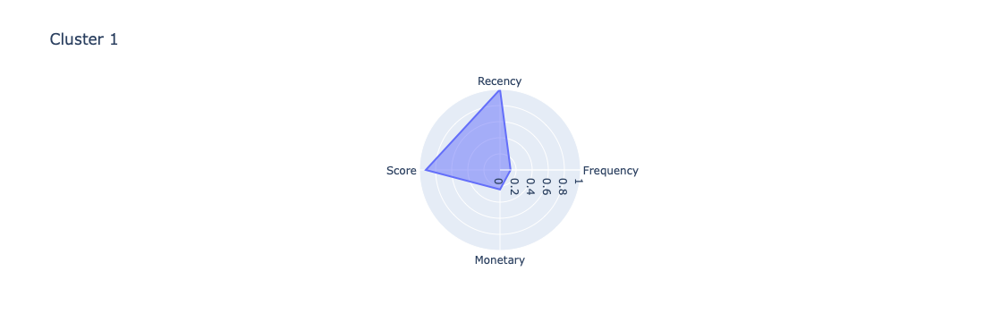

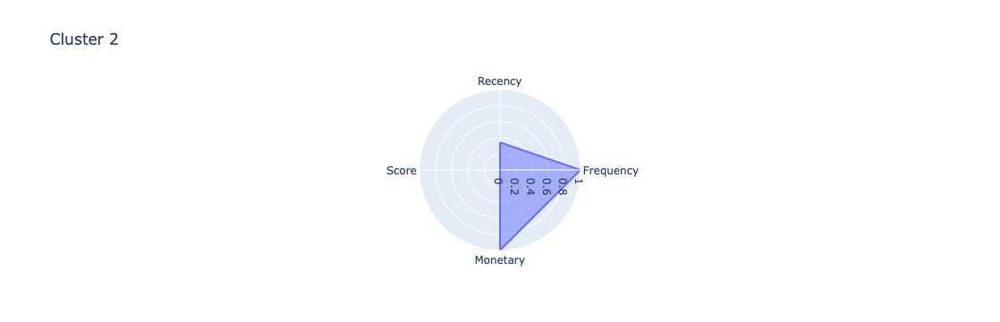

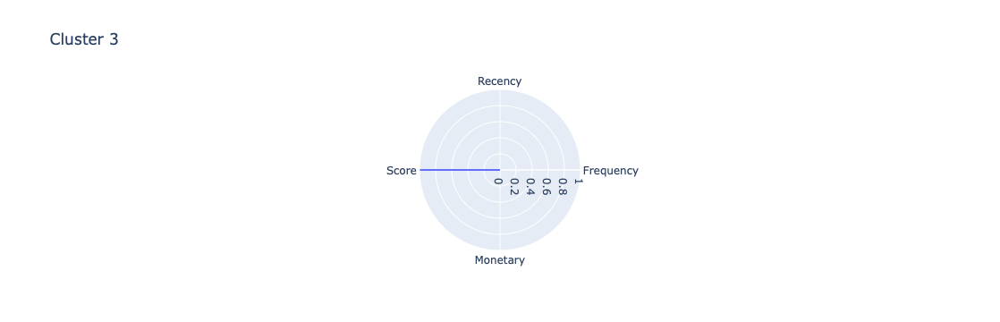

In [126]:
radar_cluster(rfm_score_kmeans_scaled_k4, 'cluster', strat='mean')

In [127]:
print('Modèle kmeans k=4')
print('Silhouette Score : ', silhouette_score(rfm_score_scaled,
                                              rfm_score_lab_k4))
print('Davies Bouldin Score : ', davies_bouldin_score(rfm_score_scaled,
                                                      rfm_score_lab_k4))
print('Calinski Harabasz Score : ', calinski_harabasz_score(rfm_score_scaled,
                                                            rfm_score_lab_k4))

Modèle kmeans k=4
Silhouette Score :  0.48323325201445383
Davies Bouldin Score :  0.7690786461779351
Calinski Harabasz Score :  127716.68993855451


##### Modèle kmeans avec k = 3

In [128]:
mod_rfm_score_k3 = KMeans(n_clusters=3, random_state=42)
mod_rfm_score_k3.fit(rfm_score_scaled)

/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



KMeans(n_clusters=3, random_state=42)

In [129]:
rfm_score_lab_k3 = mod_rfm_score_k3.predict(rfm_score_scaled)

In [130]:
rfm_score_kmeans_scaled_k3 = rfm_score_scaled.copy()
rfm_score_kmeans_scaled_k3['cluster'] = rfm_score_lab_k3

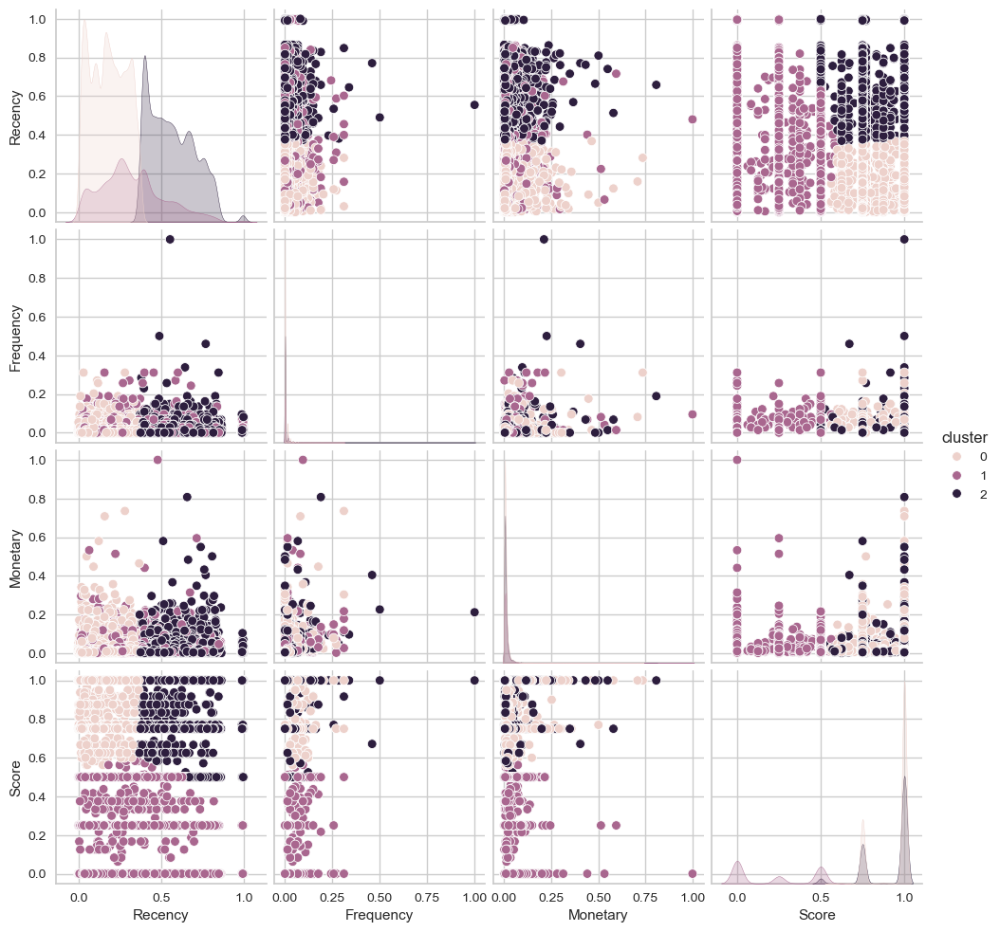

In [131]:
sns.pairplot(rfm_score_kmeans_scaled_k3, hue="cluster")

In [132]:
rfm_score_kmeans_k3 = rfm_score.copy()
rfm_score_kmeans_k3['cluster'] = rfm_score_lab_k3

In [133]:
rfm_score_kmeans_k3.groupby('cluster').mean()

,Recency,Frequency,Monetary,Score
cluster,,,,
0,125.476444,1.199478,143.861984,4.749967
1,224.756752,1.367059,160.492777,1.878829
2,393.653343,1.219450,148.179760,4.669180


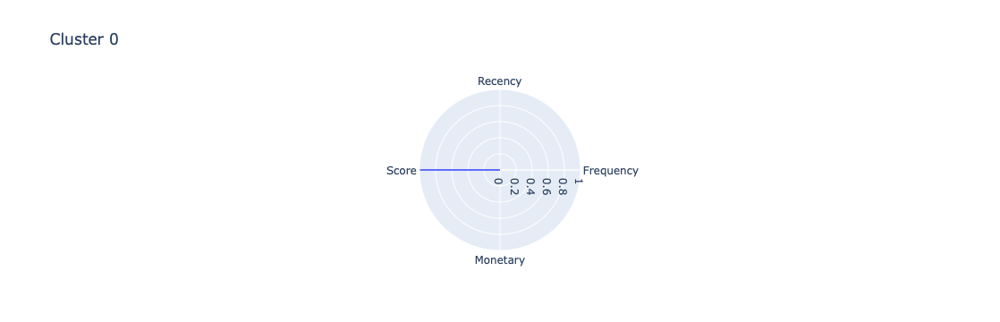

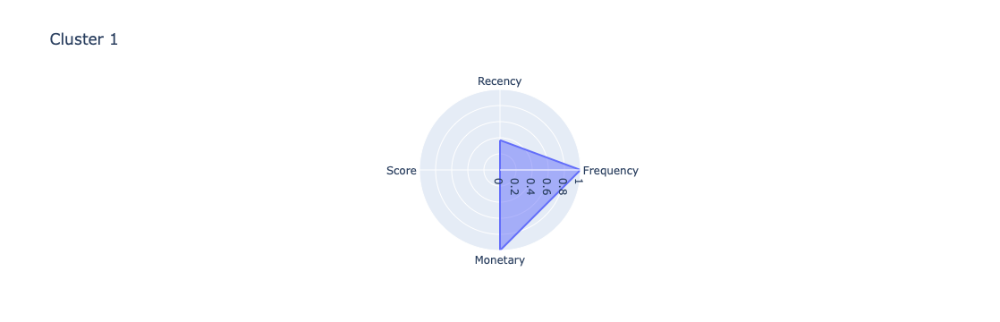

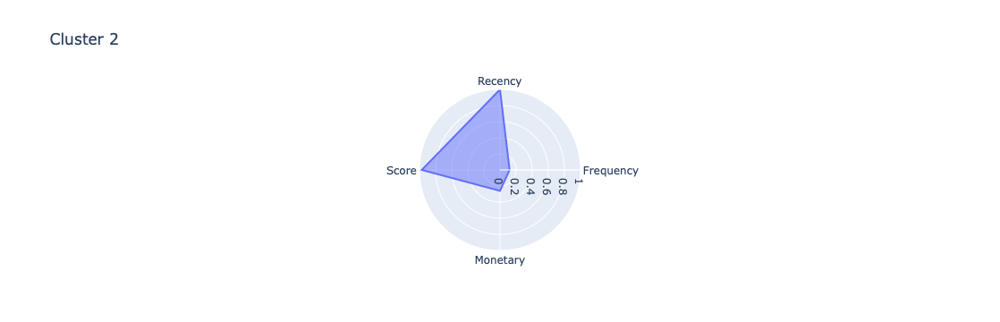

In [134]:
radar_cluster(rfm_score_kmeans_scaled_k3, 'cluster', strat='mean')

In [135]:
print('Modèle kmeans k=3')
print('Silhouette Score : ', silhouette_score(rfm_score_scaled,
                                              rfm_score_lab_k3))
print('Davies Bouldin Score : ', davies_bouldin_score(rfm_score_scaled,
                                                      rfm_score_lab_k3))
print('Calinski Harabasz Score : ', calinski_harabasz_score(rfm_score_scaled,
                                                            rfm_score_lab_k3))

Modèle kmeans k=3
Silhouette Score :  0.46676371504086295
Davies Bouldin Score :  0.7556577540733899
Calinski Harabasz Score :  123962.29613797332


# 4. Segmentation RFM + score + payment type

Nous ajoutons au dataframe précédent une variable : les types de paiements.

In [136]:
# Sélection des colonnes
rfm_pay = data[['customer_unique_id', 'time_since_last_order',
                'nb_total_order', 'total_price',
                'mean_review_score', 'payment_type']].copy()

# Colonnes quantitatives
col_quanti = ['time_since_last_order', 'nb_total_order', 'total_price', 'mean_review_score']
# Colonne catégorielle à encoder
col_quali = ['payment_type']

# Définir les transformateurs
minmax_scale = MinMaxScaler()
ohe = OneHotEncoder(drop='first', sparse=False, handle_unknown='ignore')

# Créer le préprocesseur
preprocessor = ColumnTransformer(transformers=[
    ('quanti', minmax_scale, col_quanti),
    ('quali', ohe, col_quali)
])

# Appliquer les transformations
rfm_pay_scaled_array = preprocessor.fit_transform(rfm_pay)

# Récupérer les noms des colonnes encodées
encoded_col_names = preprocessor.named_transformers_['quali'].get_feature_names_out(col_quali)
final_columns = col_quanti + list(encoded_col_names)

# Créer le DataFrame final avec customer_unique_id comme index
rfm_pay_scaled = pd.DataFrame(rfm_pay_scaled_array,
                              index=rfm_pay['customer_unique_id'],
                              columns=final_columns)

/opt/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



In [137]:
rfm_pay.head()

,customer_unique_id,time_since_last_order,nb_total_order,total_price,mean_review_score,payment_type
0,0000366f3b9a7992bf8c76cfdf3221e2,111,1,129.90,5.0,credit_card
1,0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,18.90,4.0,credit_card
2,0000f46a3911fa3c0805444483337064,536,1,69.00,3.0,credit_card
3,0000f6ccb0745a6a4b88665a16c9f078,320,1,25.99,4.0,credit_card
4,0004aac84e0df4da2b147fca70cf8255,287,1,180.00,5.0,credit_card


## 4.1 KElbowVisualizer

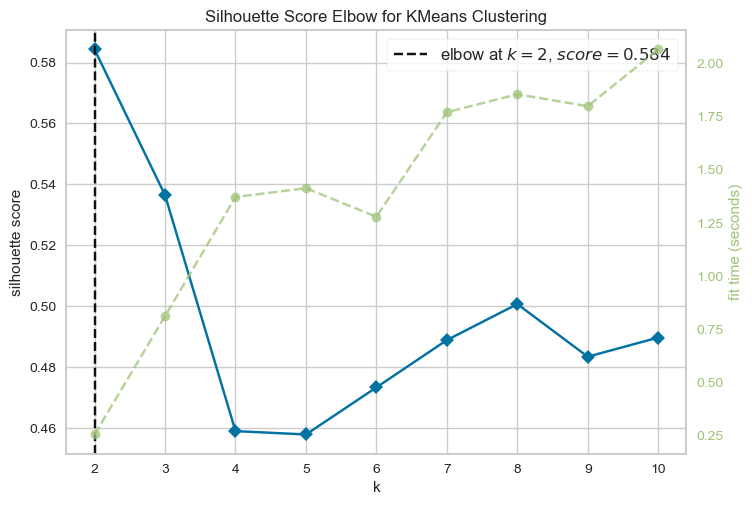

In [138]:
vis = elbow_visualizer(2, 11, rfm_pay_scaled, 'silhouette')

In [139]:
recap_kmeans_rfm_pay = pd.DataFrame(data={'k': np.arange(2, 11),
                                               'sil_scores': vis.k_scores_,
                                               'temps': vis.k_timers_})

In [140]:
recap_kmeans_rfm_pay

,k,sil_scores,temps
0,2,0.584278,0.254656
1,3,0.536437,0.811311
2,4,0.458979,1.371656
3,5,0.457876,1.413263
4,6,0.473329,1.278844
5,7,0.488863,1.770646
6,8,0.500687,1.854945
7,9,0.483416,1.798997
8,10,0.489699,2.065730


In [141]:
k_select = vis.elbow_value_

In [142]:
k_select

2

## 4.2 Silhouette Visualizer

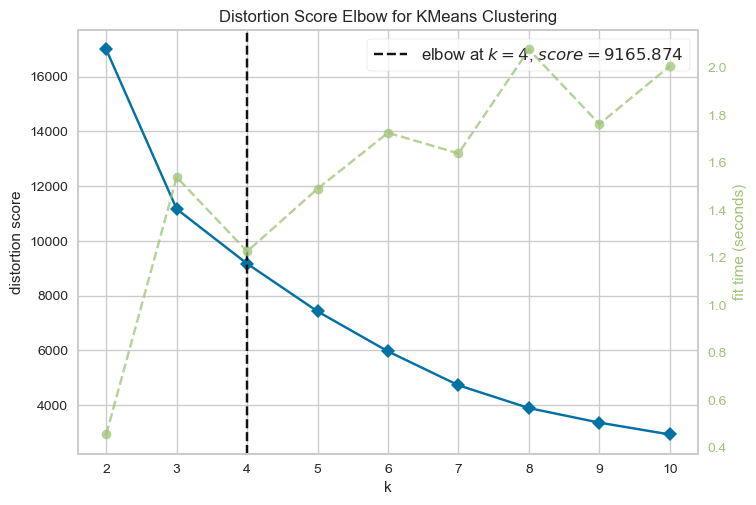

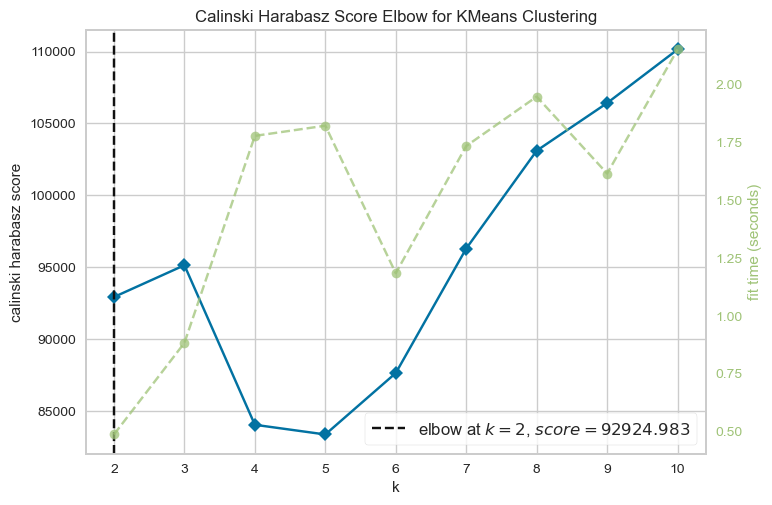

In [143]:
metrics = ["distortion", "calinski_harabasz"]

for m in metrics:
    elbow_visualizer(2, 11, rfm_pay_scaled, m)

La méthode du coude avec le score de distortion nous indique un k optimal de 4. Avec la métrique 'calinski_harabasz', le choix se porte plutôt sur k = 2.

Nous allons désormais également étudier le graphique silhouette pour ces différents clustering (k égal 4 et 2).

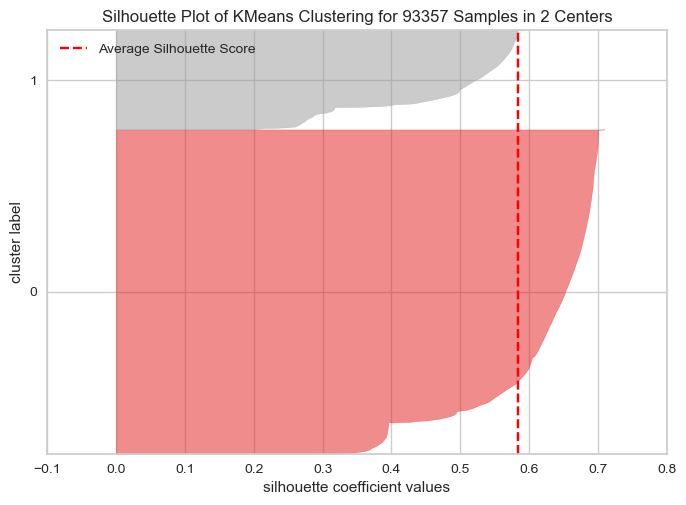

SilhouetteVisualizer(ax=<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 93357 Samples in 2 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     estimator=KMeans(n_clusters=2, n_init=10, random_state=42))

In [144]:
silhouette_visualizer(2, rfm_pay_scaled)

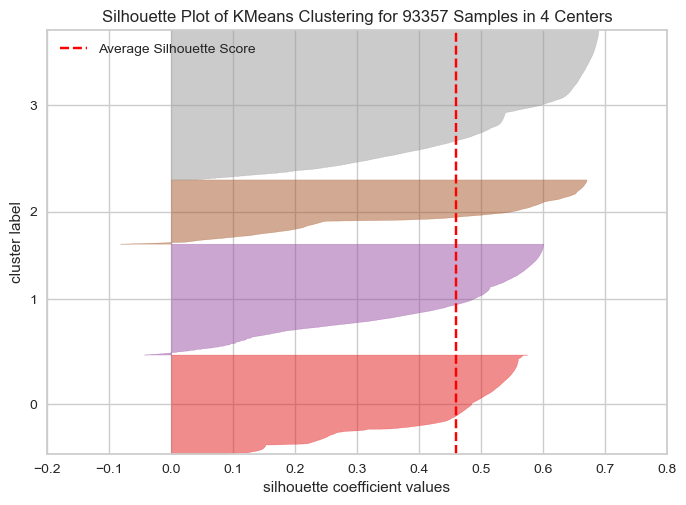

SilhouetteVisualizer(ax=<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 93357 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     estimator=KMeans(n_clusters=4, n_init=10, random_state=42))

In [145]:
silhouette_visualizer(4, rfm_pay_scaled)

Pour k = 3, le cluster 2 est plus large que le 0 et le 1 qui eux ont quelques observations qui semblent avoir un silhouette score négatif. Le silhouette score moyen est d'environ 0.45.

Pour k = 4, les clusters sont déséquilibrés. Les clusters 1 et 3 sont très larges tandis que les clusters 0 et 2 sont très fins. Deux des quatre clusters possèdent quelques observations ayant un silhouette score négatif. Le score moyen est d'environ 0.45 également.

## 4.3 Distance intercluster

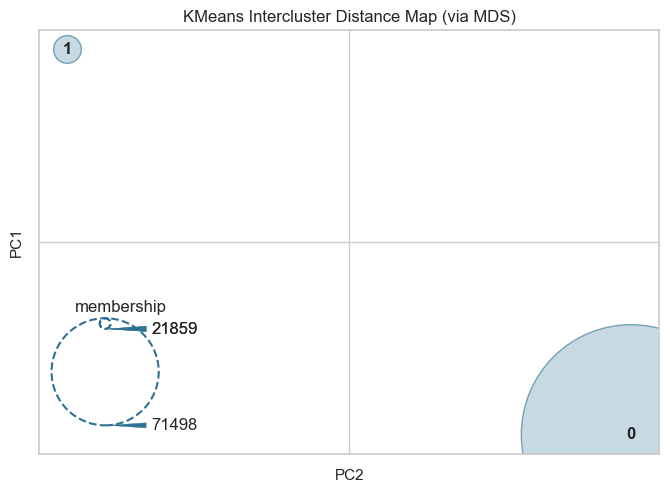

InterclusterDistance(ax=<Axes: title={'center': 'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>,
                     estimator=KMeans(n_clusters=2, n_init=10, random_state=42))

In [146]:
distance_visualizer(2, rfm_pay_scaled)

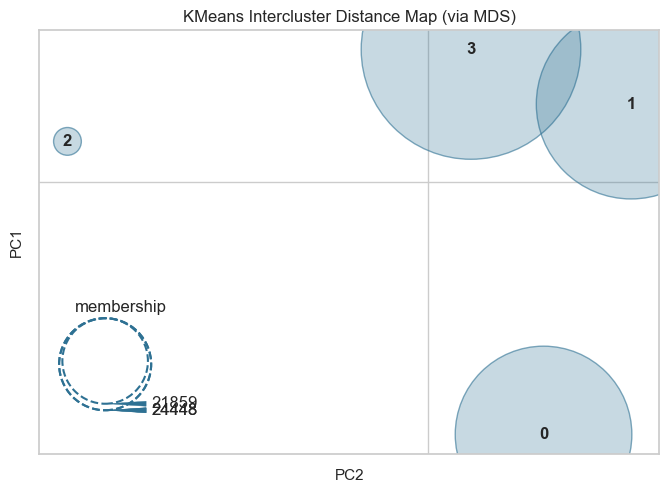

InterclusterDistance(ax=<Axes: title={'center': 'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>,
                     estimator=KMeans(n_clusters=4, n_init=10, random_state=42))

In [147]:
distance_visualizer(4, rfm_pay_scaled)

Pour nos différents clustering, les clusters sont bien séparés sur les deux premières composantes principales. En ce qui concerne k=4, les clusters 0 et 2 se chevauchent très légèrement tandis que les autres semblent bien reparties et séparés.

## 4.4 Analyse métier des différents clustering

##### Modèle kmeans avec k = 2

In [148]:
mod_rfm_pay_final = KMeans(n_clusters=k_select, random_state=42)
mod_rfm_pay_final.fit(rfm_pay_scaled)

/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



KMeans(n_clusters=2, random_state=42)

In [149]:
rfm_pay_lab = mod_rfm_pay_final.predict(rfm_pay_scaled)

In [150]:
rfm_pay_kmeans_scaled = rfm_pay_scaled.copy()
rfm_pay_kmeans_scaled['cluster'] = rfm_pay_lab

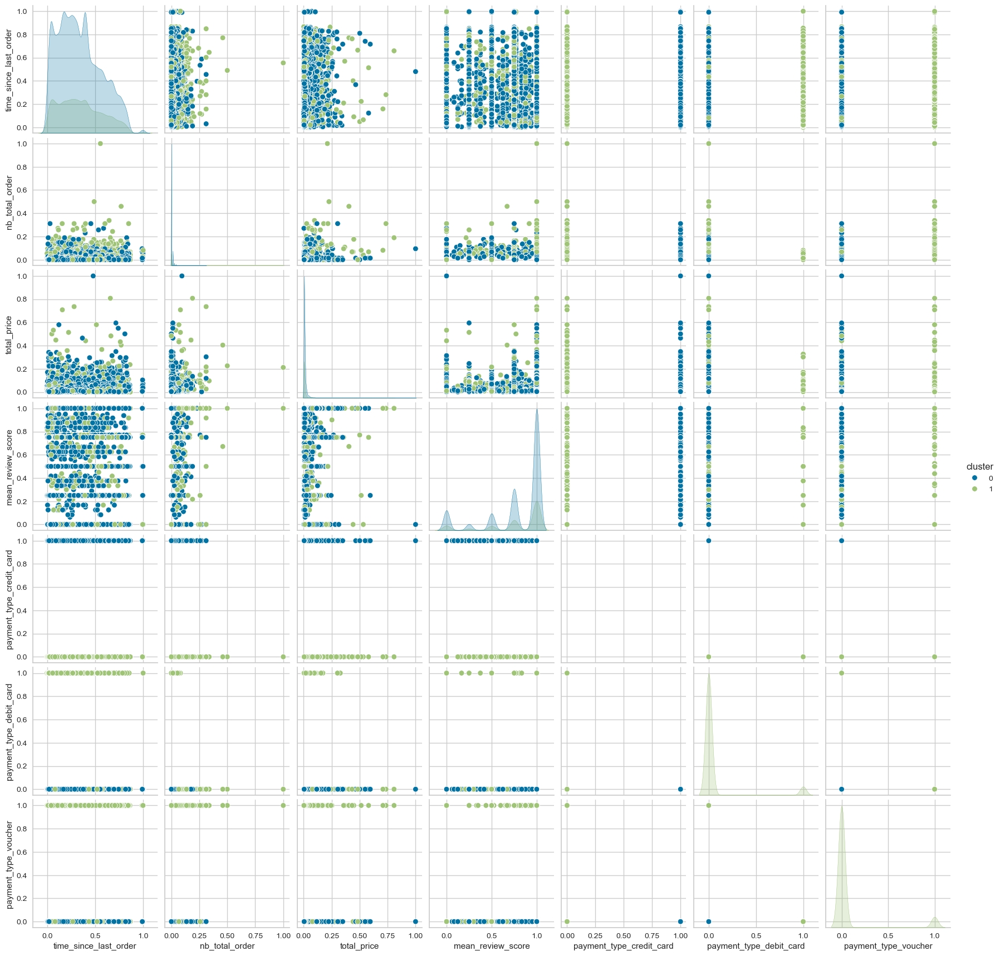

In [151]:
sns.pairplot(rfm_pay_kmeans_scaled, hue="cluster")

In [152]:
rfm_pay_kmeans = rfm_pay.copy()
rfm_pay_kmeans['cluster'] = rfm_pay_lab

/var/folders/f1/6tjqbrdd3vz74bz9bkl_0bjh0000gn/T/ipykernel_31078/1440845593.py:30: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



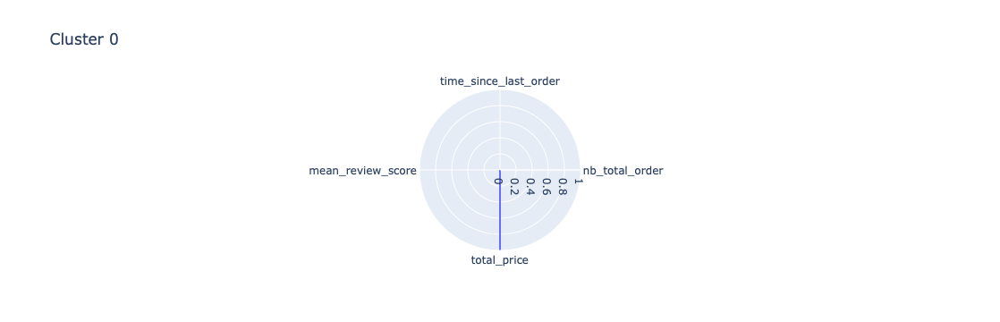

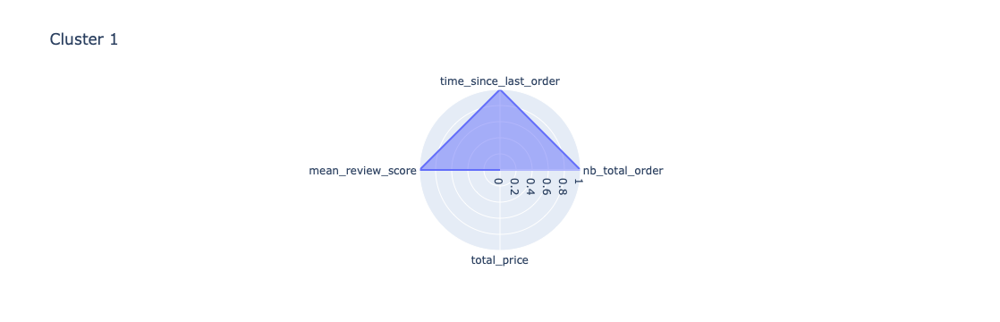

In [153]:
radar_cluster(rfm_pay_kmeans, 'cluster', strat='mean')

##### Modèle kmeans avec k = 4

In [154]:
mod_rfm_pay_k4 = KMeans(n_clusters=4, random_state=42)
mod_rfm_pay_k4.fit(rfm_pay_scaled)

/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



KMeans(n_clusters=4, random_state=42)

In [155]:
rfm_pay_lab_k4 = mod_rfm_pay_k4.predict(rfm_pay_scaled)

In [156]:
rfm_pay_kmeans_scaled_k4 = rfm_pay_scaled.copy()
rfm_pay_kmeans_scaled_k4['cluster'] = rfm_pay_lab_k4

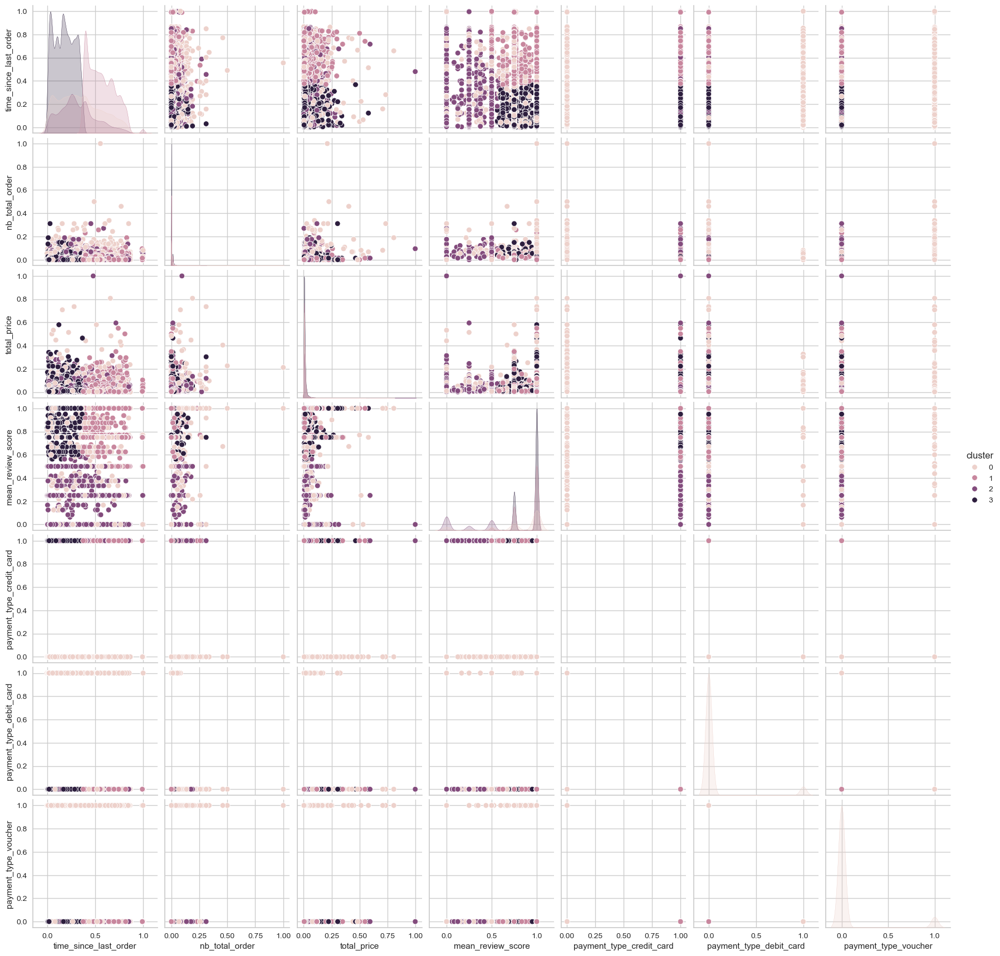

In [157]:
sns.pairplot(rfm_pay_kmeans_scaled_k4, hue="cluster")

In [158]:
rfm_pay_kmeans_k4 = rfm_pay.copy()
rfm_pay_kmeans_k4['cluster'] = rfm_pay_lab_k4

In [159]:
rfm_pay_kmeans_scaled_k4.groupby('cluster').mean()

,time_since_last_order,nb_total_order,total_price,mean_review_score,payment_type_credit_card,payment_type_debit_card,payment_type_voucher
cluster,,,,,,,
0,0.348262,0.004312,0.010107,0.788613,0.0,0.065328,0.079921
1,0.564496,0.002589,0.011238,0.917416,1.0,0.000000,0.000000
2,0.321119,0.004572,0.012163,0.217646,1.0,0.000000,0.000000
3,0.179767,0.002430,0.010907,0.937610,1.0,0.000000,0.000000


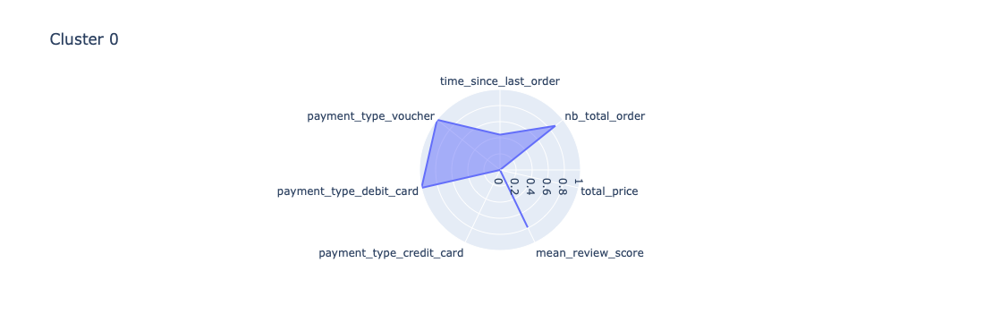

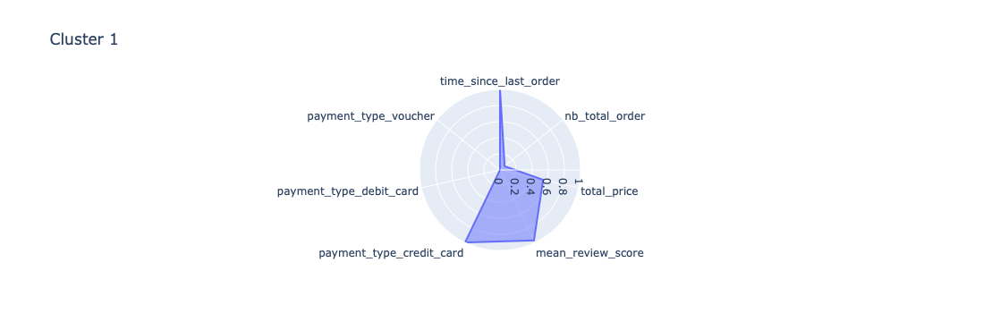

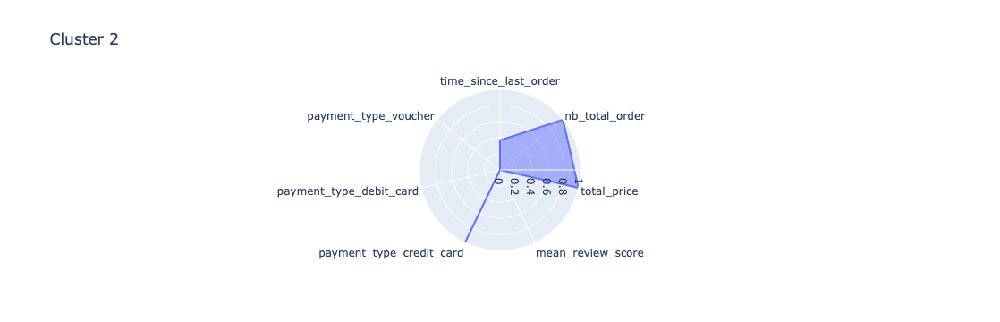

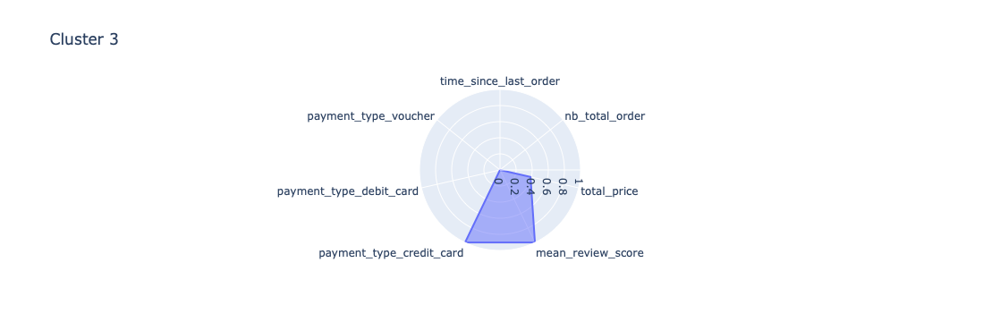

In [160]:
radar_cluster(rfm_pay_kmeans_scaled_k4, 'cluster', strat='mean')

In [161]:
print('Modèle kmeans k=4')
print('Silhouette Score : ', silhouette_score(rfm_pay_scaled,
                                              rfm_pay_lab_k4))
print('Davies Bouldin Score : ', davies_bouldin_score(rfm_pay_scaled,
                                                      rfm_pay_lab_k4))
print('Calinski Harabasz Score : ',
      calinski_harabasz_score(rfm_pay_scaled, rfm_pay_lab_k4))

Modèle kmeans k=4
Silhouette Score :  0.45897859004646646
Davies Bouldin Score :  0.7290417206172854
Calinski Harabasz Score :  84037.40707888144


In [163]:
print('Modèle kmeans k=2')
print('Silhouette Score : ', silhouette_score(rfm_pay_scaled,
                                              rfm_pay_lab))
print('Davies Bouldin Score : ', davies_bouldin_score(rfm_pay_scaled,
                                                      rfm_pay_lab))
print('Calinski Harabasz Score : ',
      calinski_harabasz_score(rfm_pay_scaled, rfm_pay_lab))

Modèle kmeans k=2
Silhouette Score :  0.5842778940068503
Davies Bouldin Score :  0.7863815575880537
Calinski Harabasz Score :  92924.98273004794


# 5. Modèle final

In [164]:
X = data[['customer_unique_id', 'time_since_last_order',
                  'nb_total_order', 'total_price',
                  'mean_review_score']].copy()

In [165]:
X = X.set_index('customer_unique_id')
X.columns = ['Recency', 'Frequency', 'Monetary', 'Score']

In [166]:
X.head()

,Recency,Frequency,Monetary,Score
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,1,129.90,5.0
0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,18.90,4.0
0000f46a3911fa3c0805444483337064,536,1,69.00,3.0
0000f6ccb0745a6a4b88665a16c9f078,320,1,25.99,4.0
0004aac84e0df4da2b147fca70cf8255,287,1,180.00,5.0


In [167]:
X.shape

(93357, 4)

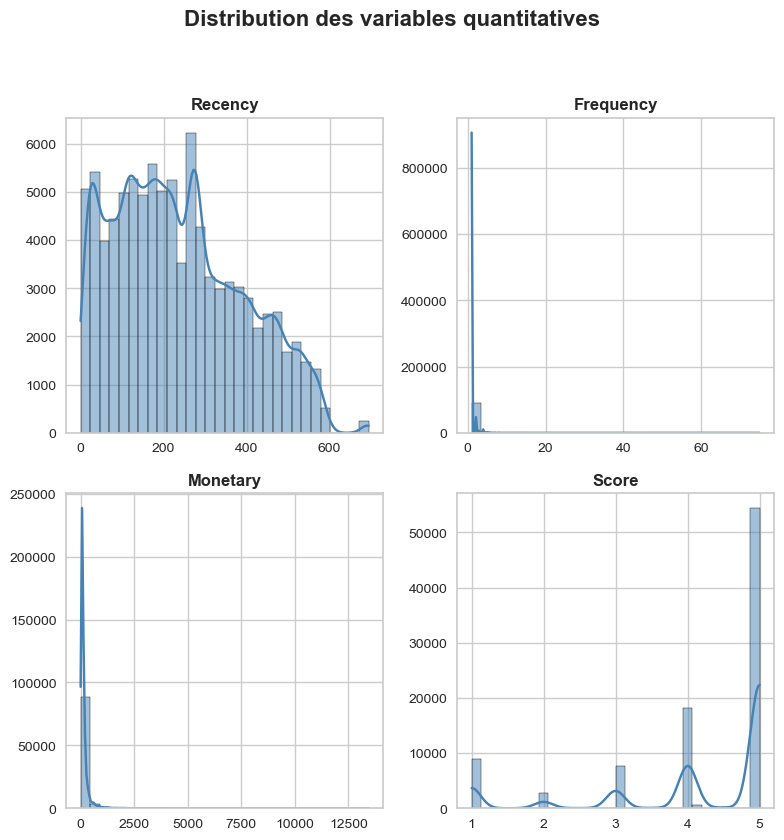

In [168]:
import import_ipynb
from fonctions import distribution_barplots

distribution_barplots(X, X.columns, 4, 2)

In [169]:
col_quanti = X.select_dtypes(['int64', 'float64']).columns
col_quali = X.select_dtypes(['category', 'object', 'bool']).columns

In [170]:
minmax_scale = MinMaxScaler()
ohe = OneHotEncoder(sparse=False)
preprocessor = ColumnTransformer(transformers=[
    ('quanti', minmax_scale, col_quanti),
    ('quali', ohe, col_quali)
])


In [171]:
X_scaled = pd.DataFrame(preprocessor.fit_transform(X),
                        index=X.index,
                        columns=X.columns)
X_scaled.head()

,Recency,Frequency,Monetary,Score
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,0.159942,0.0,0.009603,1.00
0000b849f77a49e4a4ce2b2a4ca5be3f,0.164265,0.0,0.001343,0.75
0000f46a3911fa3c0805444483337064,0.772334,0.0,0.005071,0.50
0000f6ccb0745a6a4b88665a16c9f078,0.461095,0.0,0.001871,0.75
0004aac84e0df4da2b147fca70cf8255,0.413545,0.0,0.013330,1.00


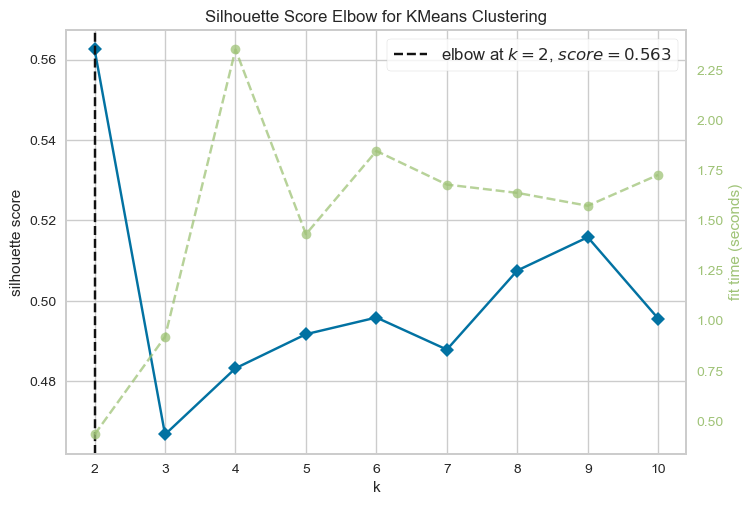

In [172]:
vis = elbow_visualizer(2, 11, X_scaled, 'silhouette')

In [173]:
recap_kmeans = pd.DataFrame(data={'k': np.arange(2, 11),
                                  'sil_scores': vis.k_scores_,
                                  'temps': vis.k_timers_})

In [174]:
recap_kmeans

,k,sil_scores,temps
0,2,0.562538,0.432463
1,3,0.466764,0.919911
2,4,0.483233,2.353470
3,5,0.491708,1.431713
4,6,0.495857,1.846963
5,7,0.487881,1.679364
6,8,0.507551,1.637877
7,9,0.515837,1.573644
8,10,0.495592,1.727879


In [175]:
k_select = vis.elbow_value_
k_select

2

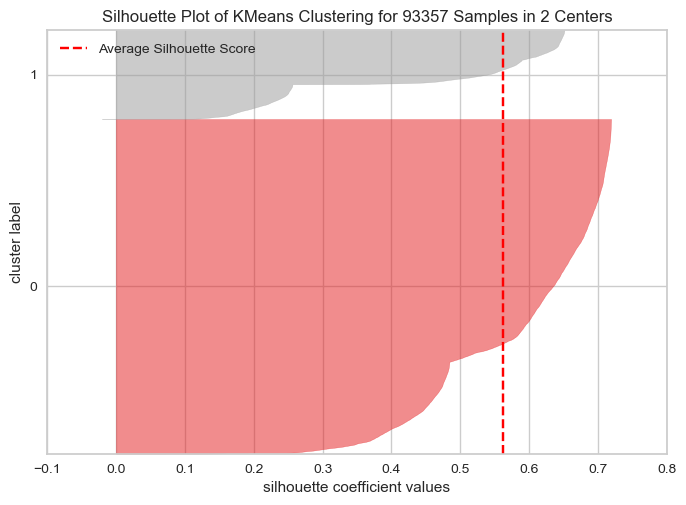

SilhouetteVisualizer(ax=<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 93357 Samples in 2 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     estimator=KMeans(n_clusters=2, n_init=10, random_state=42))

In [176]:
silhouette_visualizer(2, X_scaled)

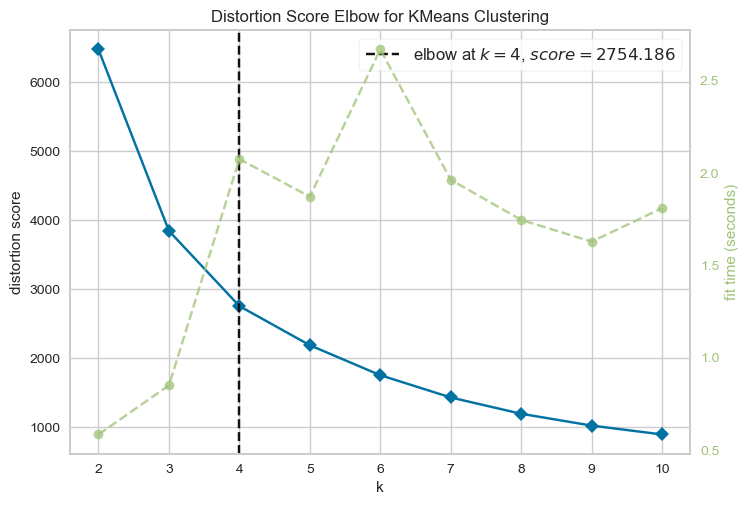

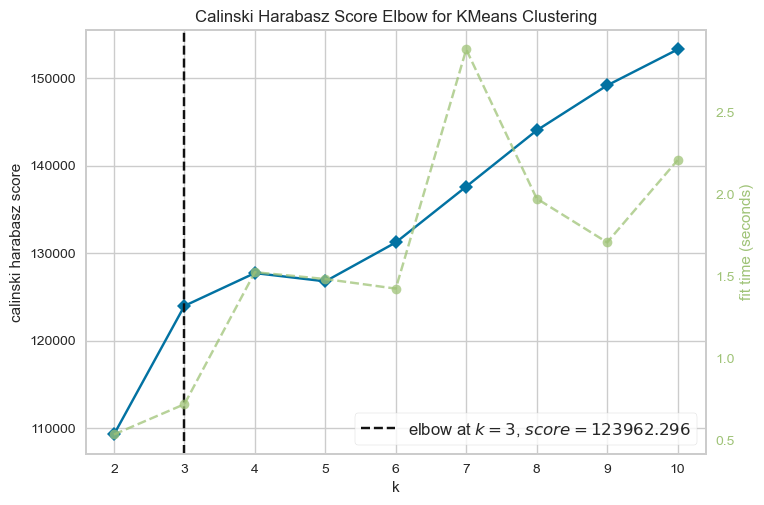

In [177]:
metrics = ["distortion", "calinski_harabasz"]

for m in metrics:
    elbow_visualizer(2, 11, X_scaled, m)

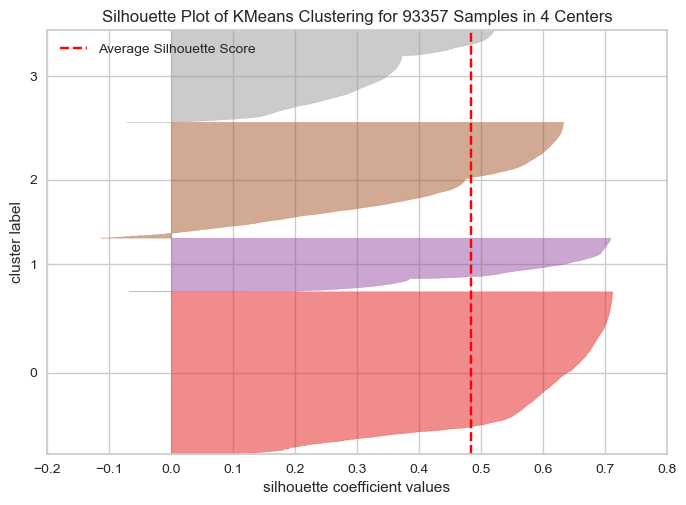

SilhouetteVisualizer(ax=<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 93357 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     estimator=KMeans(n_clusters=4, n_init=10, random_state=42))

In [178]:
silhouette_visualizer(4, X_scaled)

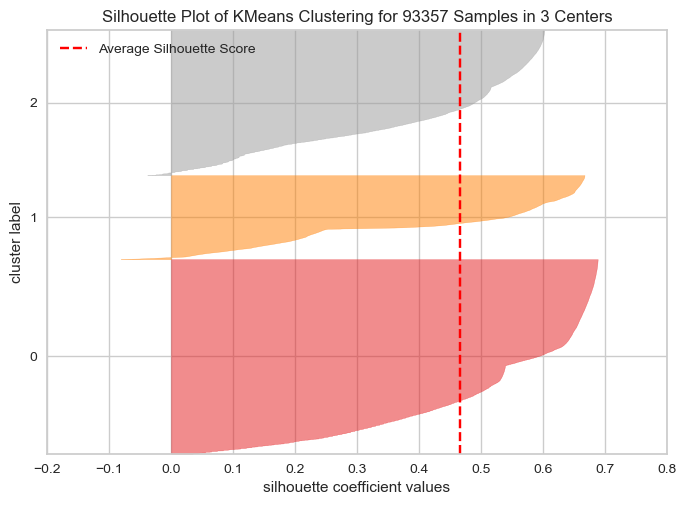

SilhouetteVisualizer(ax=<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 93357 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     estimator=KMeans(n_clusters=3, n_init=10, random_state=42))

In [179]:
silhouette_visualizer(3, X_scaled)

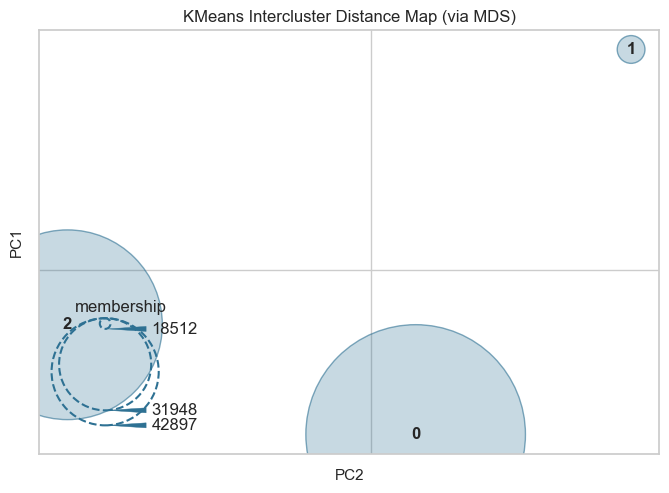

InterclusterDistance(ax=<Axes: title={'center': 'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>,
                     estimator=KMeans(n_clusters=3, n_init=10, random_state=42))

In [180]:
distance_visualizer(3, X_scaled)

/opt/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_mds.py:601: UserWarning:

The MDS API has changed. ``fit`` now constructs an dissimilarity matrix from data. To use a custom dissimilarity matrix, set ``dissimilarity='precomputed'``.



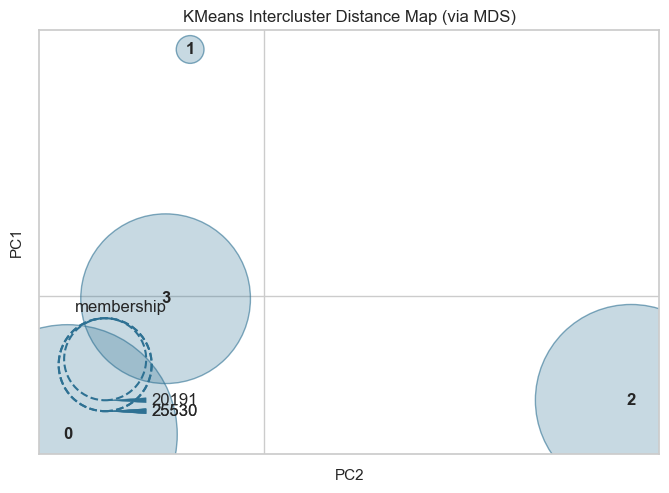

InterclusterDistance(ax=<Axes: title={'center': 'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>,
                     estimator=KMeans(n_clusters=4, n_init=10, random_state=42))

In [181]:
distance_visualizer(4, X_scaled)

##### Modèle kmeans avec k = 2

In [182]:
mod_X_final = KMeans(n_clusters=k_select, random_state=42)
mod_X_final.fit(X_scaled)

/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



KMeans(n_clusters=2, random_state=42)

In [183]:
X_lab = mod_X_final.predict(X_scaled)

In [184]:
X_kmeans_scaled = X_scaled.copy()
X_kmeans_scaled['cluster'] = X_lab

In [185]:
X_kmeans_scaled.groupby('cluster').mean()

,Recency,Frequency,Monetary,Score
cluster,,,,
0,0.340291,0.002804,0.010791,0.934934
1,0.345620,0.004873,0.011774,0.234720


In [186]:
X_kmeans = X.copy()
X_kmeans['cluster'] = X_lab

In [187]:
X_kmeans.groupby('cluster').mean()

,Recency,Frequency,Monetary,Score
cluster,,,,
0,236.162005,1.207466,145.868997,4.739736
1,239.859948,1.360587,159.083947,1.938880


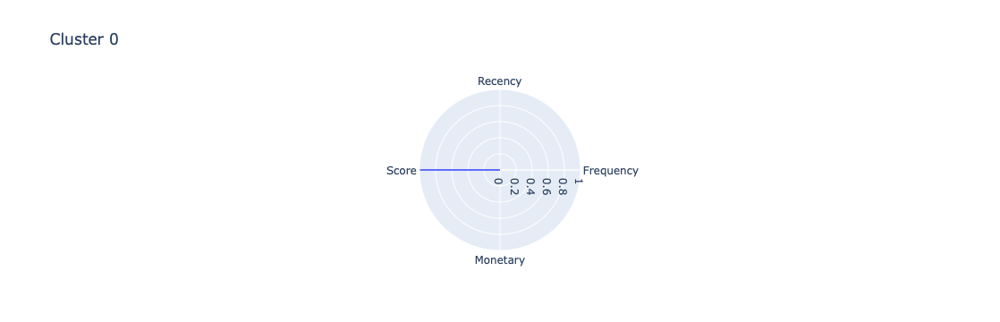

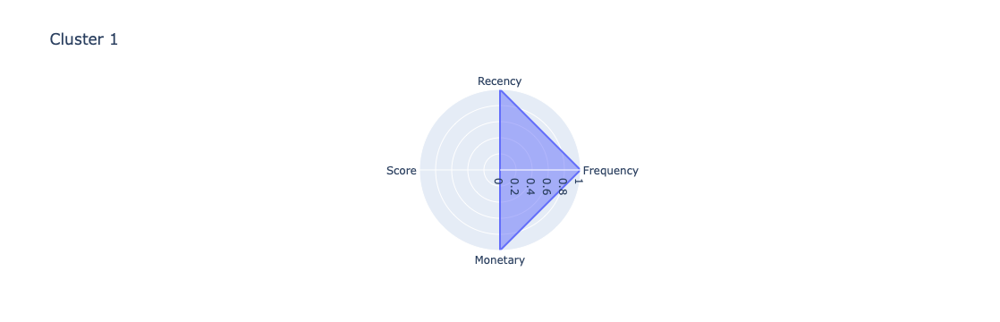

In [188]:
radar_cluster(X_kmeans, 'cluster', strat='mean')

In [189]:
print('Scores pour le modèle kmeans (k=2):')
print('Silhouette Score : ', silhouette_score(X_scaled, X_lab))
print('Davies Bouldin Score : ', davies_bouldin_score(X_scaled, X_lab))
print('Calinski Harabasz Score : ', calinski_harabasz_score(X_scaled, X_lab))

Scores pour le modèle kmeans (k=2):
Silhouette Score :  0.5625376798876929
Davies Bouldin Score :  0.7424381340016313
Calinski Harabasz Score :  109250.60398044907


##### Modèle kmeans avec k = 3

In [190]:
mod_X_final_k3 = KMeans(n_clusters=3, random_state=42)
mod_X_final_k3.fit(X_scaled)

/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



KMeans(n_clusters=3, random_state=42)

In [191]:
X_lab_k3 = mod_X_final_k3.predict(X_scaled)

In [192]:
X_kmeans_scaled_k3 = X_scaled.copy()
X_kmeans_scaled_k3['cluster'] = X_lab_k3

In [193]:
X_kmeans_scaled_k3.groupby('cluster').mean()

,Recency,Frequency,Monetary,Score
cluster,,,,
0,0.180802,0.002696,0.010641,0.937492
1,0.323857,0.004960,0.011879,0.219707
2,0.567224,0.002966,0.010963,0.917295


In [194]:
X_kmeans_k3 = X.copy()
X_kmeans_k3['cluster'] = X_lab_k3

In [195]:
X_kmeans_k3.groupby('cluster').mean()

,Recency,Frequency,Monetary,Score
cluster,,,,
0,125.476444,1.199478,143.861984,4.749967
1,224.756752,1.367059,160.492777,1.878829
2,393.653343,1.219450,148.179760,4.669180


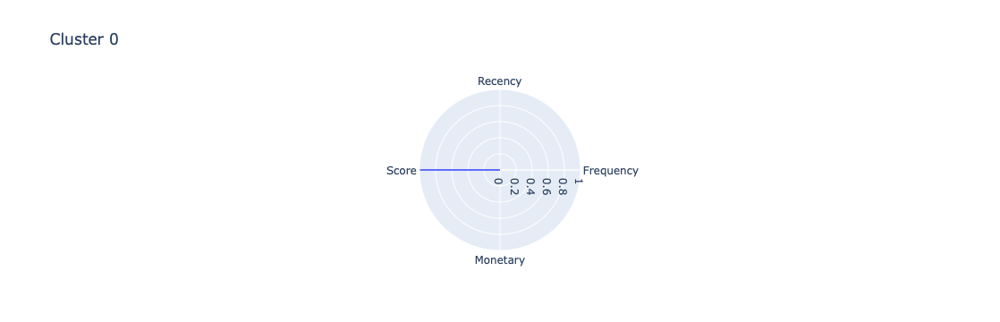

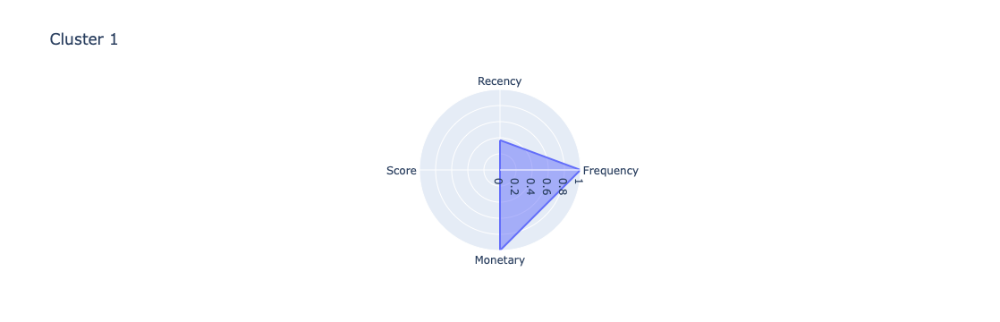

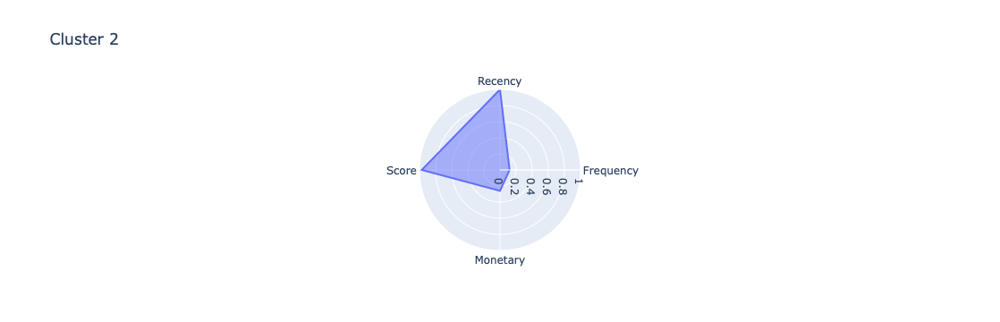

In [196]:
radar_cluster(X_kmeans_k3, 'cluster', strat='mean')

##### Modèle kmeans avec k = 4

In [197]:
mod_X_final_k4 = KMeans(n_clusters=4, random_state=42)
mod_X_final_k4.fit(X_scaled)

/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



KMeans(n_clusters=4, random_state=42)

In [198]:
X_lab_k4 = mod_X_final_k4.predict(X_scaled)

In [199]:
X_kmeans_scaled_k4 = X_scaled.copy()
X_kmeans_scaled_k4['cluster'] = X_lab_k4

In [200]:
X_kmeans_scaled_k4.groupby('cluster').mean()

,Recency,Frequency,Monetary,Score
cluster,,,,
0,0.201044,0.002614,0.010572,0.999169
1,0.340351,0.005624,0.012766,0.061922
2,0.608491,0.003010,0.011104,0.925852
3,0.253227,0.003231,0.010578,0.665826


In [201]:
X_kmeans_k4 = X.copy()
X_kmeans_k4['cluster'] = X_lab_k4

In [202]:
X_kmeans_k4.groupby('cluster').mean()

,Recency,Frequency,Monetary,Score
cluster,,,,
0,139.524284,1.193437,142.925401,4.996675
1,236.203618,1.416195,172.411319,1.247690
2,422.293028,1.222718,150.077874,4.703409
3,175.739884,1.239067,143.014529,3.663306


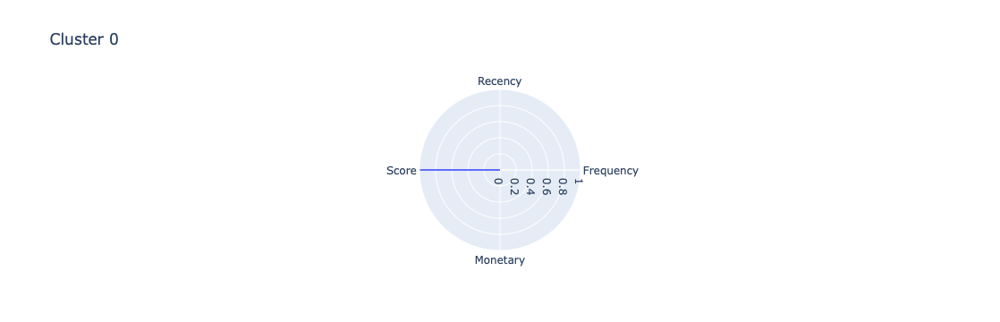

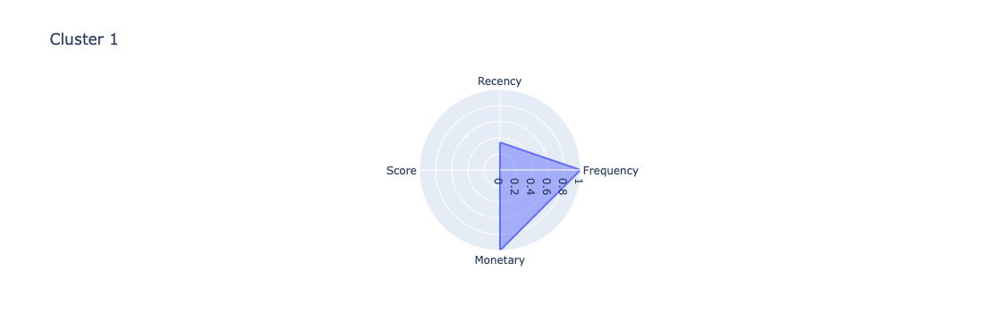

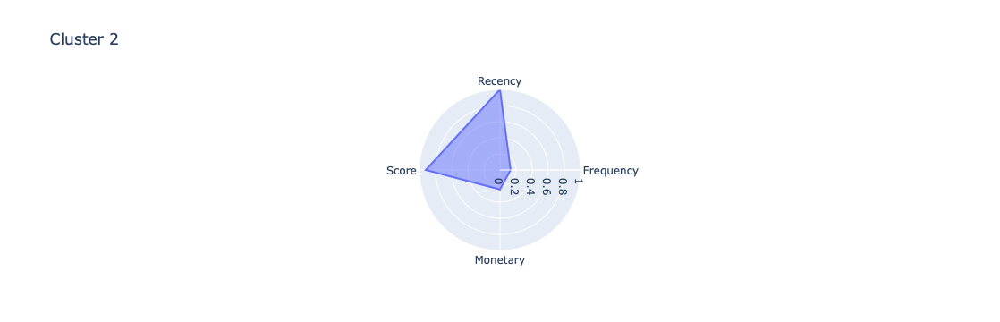

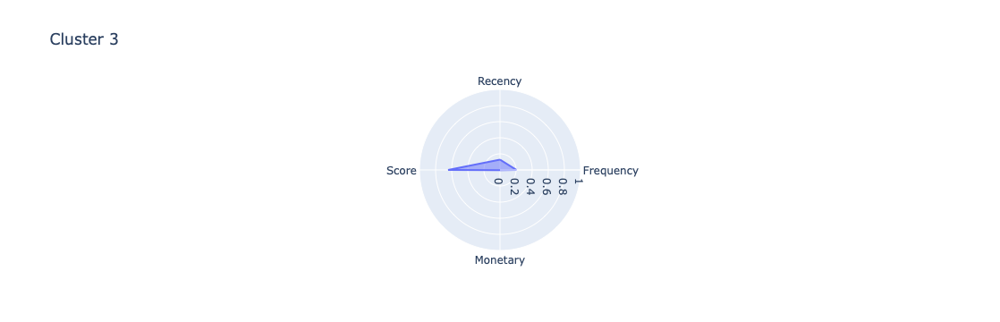

<Figure size 800x550 with 0 Axes>

In [203]:
radar_cluster(X_kmeans_k4, 'cluster', strat='mean')
plt.savefig('radar_cluster_result.png')
plt.show()

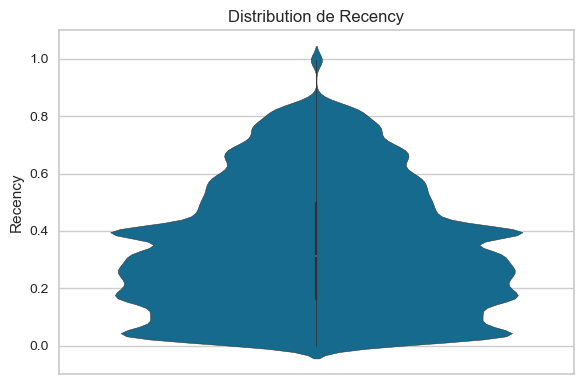

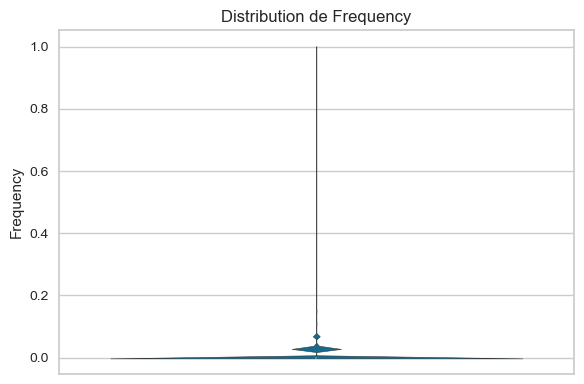

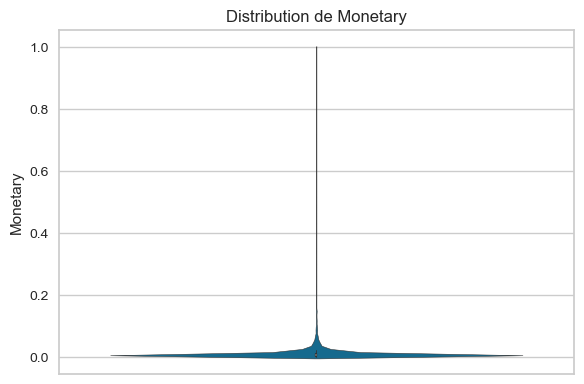

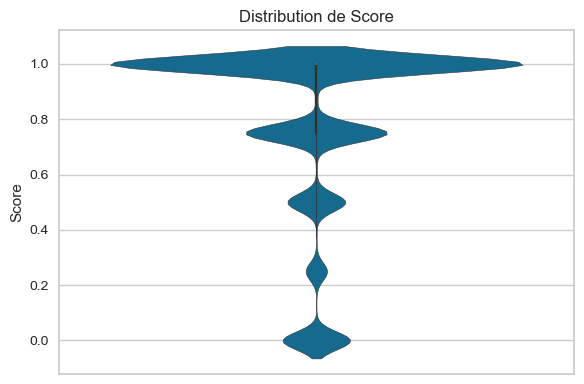

In [204]:
# Violon plot
# Parcourir chaque colonne de X_scaled
for col in X_scaled.columns:
    plt.figure(figsize=(6, 4))
    sns.violinplot(y=X_scaled[col])
    plt.title(f'Distribution de {col}')
    plt.tight_layout()
    plt.show()


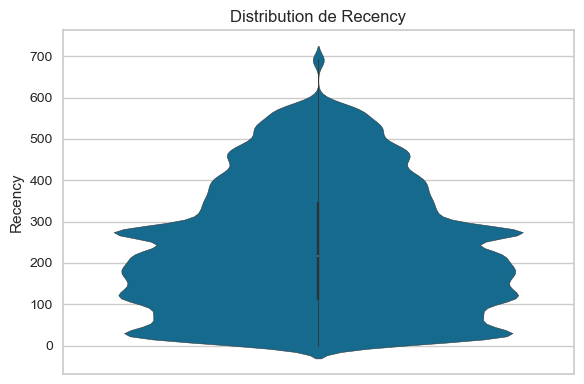

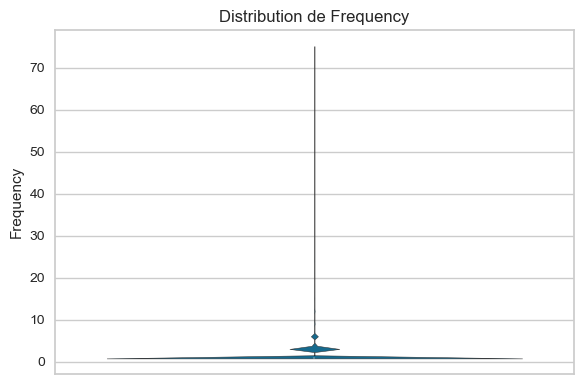

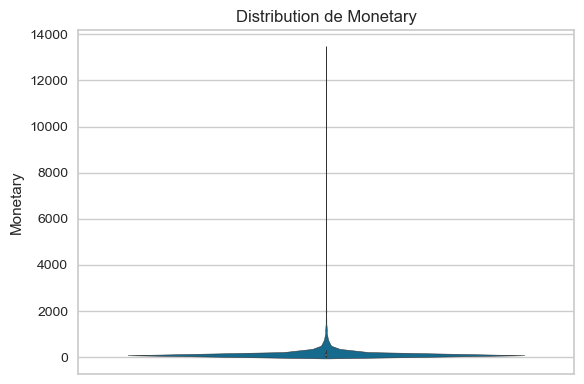

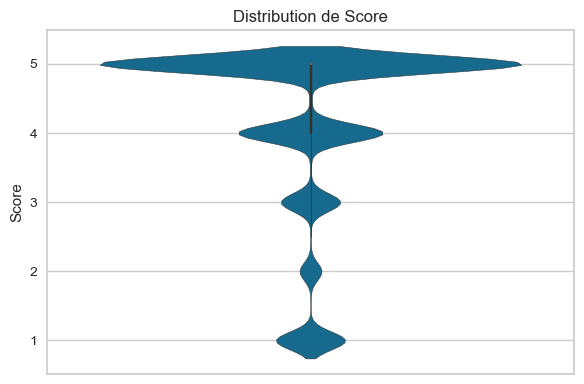

In [205]:
# Violon plot
# Parcourir chaque colonne de X_scaled
for col in X.columns:
    plt.figure(figsize=(6, 4))
    sns.violinplot(y=X[col])
    plt.title(f'Distribution de {col}')
    plt.tight_layout()
    plt.show()


Le kmeans avec k=4 identifie les 4 clusters suivants :

- Cluster 0 : Client inactif ou en perte de vitesse
- Cluster 1 : Nouveau client, potentiellement à fidélisé
- Cluster 2 : Client précieux en danger
- Cluster 3 : Prospect qui n’a jamais acheté

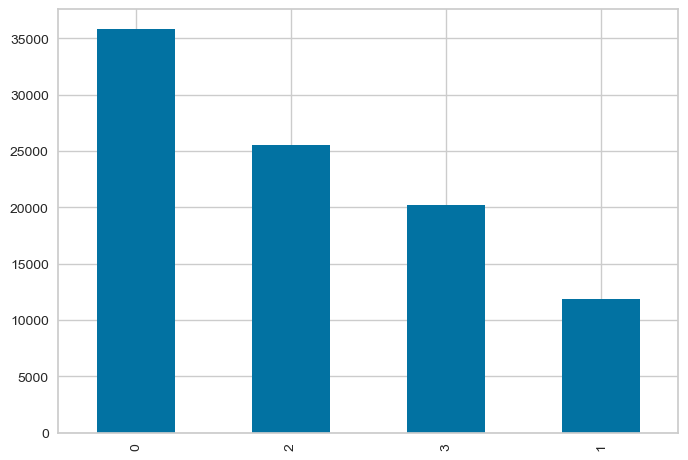

In [206]:
X_kmeans_k4['cluster'].value_counts().plot(kind="bar")
plt.show()

In [207]:
print('Scores pour le modèle kmeans (k=4):')
print('Silhouette Score : ', silhouette_score(X_scaled, X_lab_k4))
print('Davies Bouldin Score : ', davies_bouldin_score(X_scaled, X_lab_k4))
print('Calinski Harabasz Score : ', calinski_harabasz_score(X_scaled,
                                                            X_lab_k4))

Scores pour le modèle kmeans (k=4):
Silhouette Score :  0.48323325201445383
Davies Bouldin Score :  0.7690786461779351
Calinski Harabasz Score :  127716.68993855451


In [208]:
# Export du modèle
with open('models/kmeans_final', 'wb') as f1:
    pickle.dump(mod_X_final_k4, f1)